## Environment set up and import Libraries

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
with tf.device(device_name):
  print(device_name.split(":")[1]," running . . . ")

GPU  running . . . 


In [1]:
import os,sys
import numpy as np
import random
import tensorflow as tf

random.seed(1)
np.random.seed(1)
tf.random.set_seed(2)

In [2]:
import os, keras, numpy
import matplotlib.pyplot as plt
from numpy import *
from numpy.random import *
from keras.datasets.fashion_mnist import load_data
from keras.datasets import mnist, fashion_mnist
from tensorflow.keras.optimizers import Adam
from keras.models import Model
from keras.layers import *

## **Discriminator** Model

In [4]:
def define_discriminator(in_shape=(28,28,1), n_classes=5):

  # input level
  in_label = Input(shape=(1,), name="Input_Label")
  li = Embedding(n_classes, 50, name="Embedding_Layer_1")(in_label)
  li = Dense(in_shape[0] * in_shape[1], name="Dense_Layer_1")(li)
  li = Reshape((in_shape[0], in_shape[1], 1), name="Reshape_Layer_1")(li)

  # input image
  in_image = Input(shape=in_shape, name="Input_Image")

  # concate 1
  merge = Concatenate(name="Concatenation_Layer_1")([in_image, li])

  fe = Conv2D(128, (3,3), strides=(2,2), padding='same', activation = 'relu', name="Convolution_Layer_1")(merge)

  # concate 2
  se1 = Embedding(n_classes, 50, name="Embedding_Layer_2")(in_label)
  se1 = Dense(14*14, activation='relu', name="Dense_Layer_2")(se1)
  se1 = Reshape((14, 14, 1), name="Reshape_Layer_2")(se1)

  merge1 = Concatenate(name="Concatenation_Layer_2")([fe, se1])

  fe = Conv2D(128, (3,3), strides=(2,2), padding='same', activation = 'relu', name="Convolution_Layer_2")(merge1)
  fe = Flatten(name="Flatten_Layer")(fe)
  fe = Dropout(0.2, name="Dropout_Layer")(fe)
  
  # final layer
  out_layer = Dense(1, activation='sigmoid', name="Dense_Layer_3")(fe)

  model = Model([in_image, in_label], out_layer, name="Mnist_Discriminator_Model")

  opt = Adam(learning_rate= 3e-4, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
  return model
a = define_discriminator()
# a.summary()

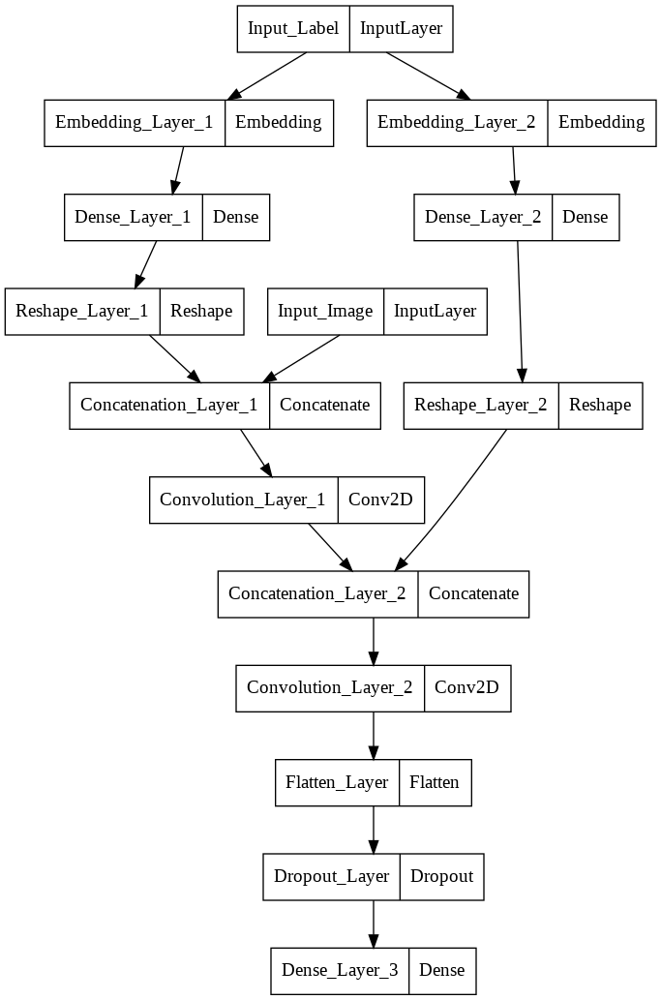

In [5]:
# plot the discriminator model
tf.keras.utils.plot_model(a)

## **Generator** Model

In [6]:
def define_generator(latent_dim = 100, n_classes=5):

  # label input
  in_label = Input(shape=(1,), name="Input_Label")
  li_embedd = Embedding(n_classes, 50, name="Embedding_Layer")(in_label)
  li = Dense(7 * 7, activation='relu', name="Dense_Layer_1")(li_embedd)
  li = Reshape((7, 7, 1), name="Reshape_Layer_1")(li)

  # latent input
  in_latent = Input(shape=(latent_dim,), name='Input_Latent')

  n_nodes = 128 * 7 * 7
  gen = Dense(n_nodes, activation = 'relu', name="Dense_Layer_2")(in_latent)
  gen = Reshape((7, 7, 128), name="Reshape_Layer_2")(gen)

  # concate 1
  merge = Concatenate(name="Concatenation_Layer_1")([gen, li])

  gen = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same', activation = 'relu', name="Convolution_Transpose_Layer_1")(merge)

  # concate 2
  se1 = Dense(14*14, activation='relu', name="Dense_Layer_3")(li_embedd)
  se1 = Reshape((14, 14, 1), name="Reshape_Layer_3")(se1)
  merge1 = Concatenate(name="Concatenation_Layer_2")([gen, se1])
  gen = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same', activation = 'relu', name="Convolution_Transpose_Layer_2")(merge1)

  # final layer
  out_layer = Conv2D(1, (7,7), activation='tanh', padding='same', name="Convolution_Layer")(gen)

  model = Model([in_latent, in_label], out_layer)
  return model
b = define_generator(100)
b.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input_Label (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 Input_Latent (InputLayer)      [(None, 100)]        0           []                               
                                                                                                  
 Embedding_Layer (Embedding)    (None, 1, 50)        250         ['Input_Label[0][0]']            
                                                                                                  
 Dense_Layer_2 (Dense)          (None, 6272)         633472      ['Input_Latent[0][0]']           
                                                                                              

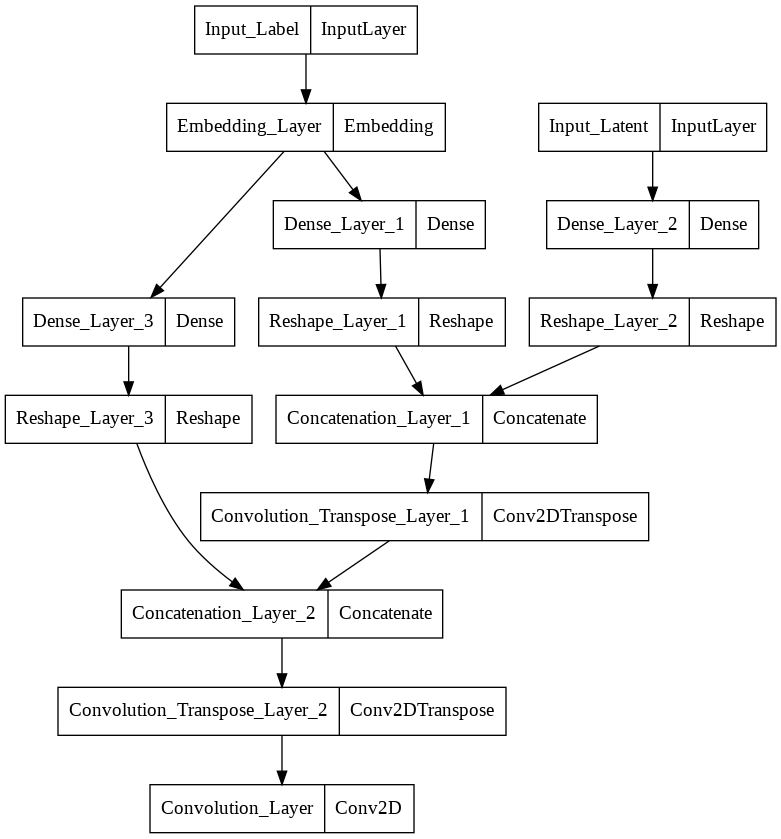

In [7]:
# plot the generator model
tf.keras.utils.plot_model(b)

## **Combine** or **GAN** Model

In [8]:
def define_gan(g_model, d_model):

  d_model.trainable = False

  gen_noise, gen_label = g_model.input
  gen_output = g_model.output

  gan_output = d_model([gen_output, gen_label])

  model = Model([gen_noise, gen_label], gan_output)

  opt = Adam(learning_rate= 3e-4, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt,  metrics=['accuracy'])
  
  return model
c = define_gan(b, a)
c.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input_Label (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 Input_Latent (InputLayer)      [(None, 100)]        0           []                               
                                                                                                  
 Embedding_Layer (Embedding)    (None, 1, 50)        250         ['Input_Label[0][0]']            
                                                                                                  
 Dense_Layer_2 (Dense)          (None, 6272)         633472      ['Input_Latent[0][0]']           
                                                                                            

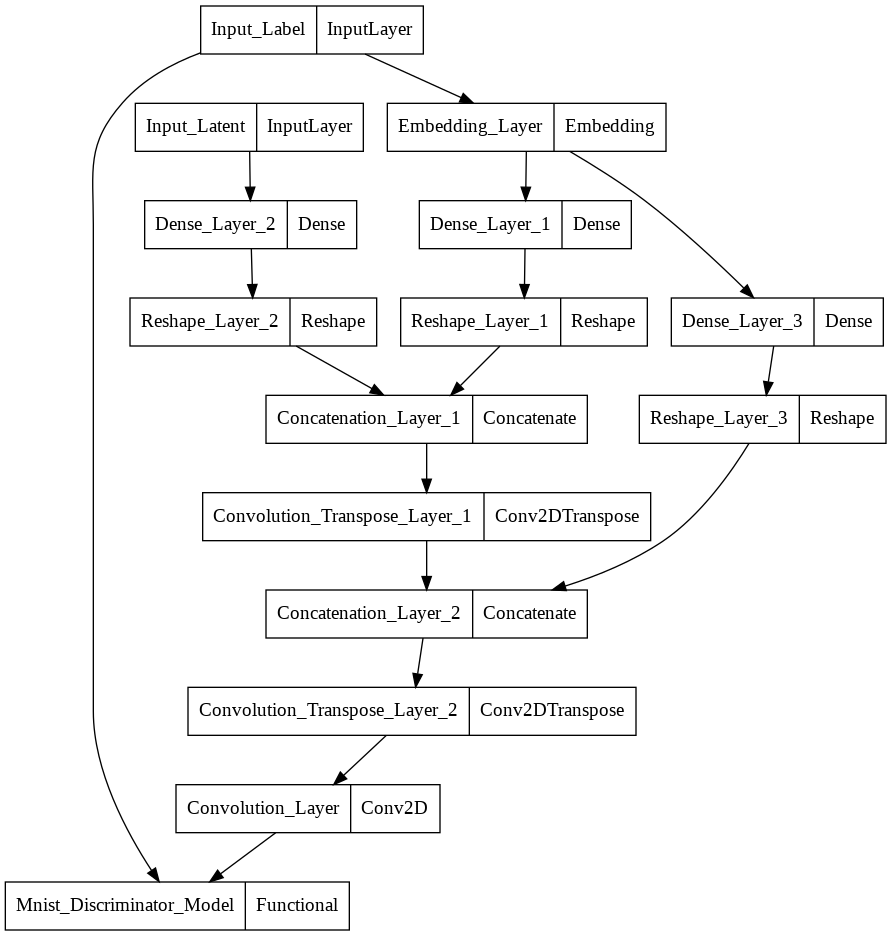

In [9]:
# plot GAN model
tf.keras.utils.plot_model(c)

## Load Fashion-Mnist Dataset

In [ ]:
def load_real_samples():
  # random.seed(1)
  # load dataset
  (trainX, trainy), (_, _) = fashion_mnist.load_data()
  trainy = randint(0, 5, trainX.shape[0])
  # expand to 3d, e.g. add channels
  X = expand_dims(trainX, axis=-1)
  X = X.astype('float32')
  # scale from [0,255] to [-1,1]
  X = (X - 127.5) / 127.5
  return [X, trainy]
k = load_real_samples()
print("image: ",k[0].shape," Lable: ",k[1].shape)
print("\nshape/size of the first 16 data: ",k[0][:16].shape)
print(k[1][:20])
print(k[1].shape)

4431872/4422102 [==============================] - 0s 0us/step
image:  (60000, 28, 28, 1)  Lable:  (60000,)

shape/size of the first 16 data:  (16, 28, 28, 1)
[3 4 0 1 3 0 0 1 4 4 1 2 4 2 4 3 4 2 4 2]
(60000,)


## Plot data with label

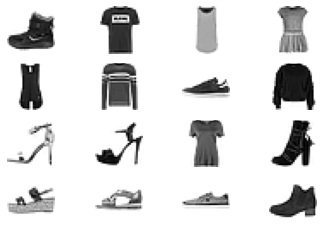

In [ ]:
def save_plot(x_input,lebel,n=4):
    for i in range(n*n):
        plt.subplot(n, n, i+1)
        # plt.title(str(lebel[i]),fontsize=10,color="red",fontweight=10,pad='2.0',backgroundcolor='yellow')
        plt.imshow(x_input[i,:,:,0], cmap = 'gray_r')
        plt.axis('off')
    plt.show()
# plot data
save_plot(k[0][:16], k[1][:16])

## Generate real sample function

In [ ]:
def generate_real_samples(dataset, n_samples):
	images, labels = dataset
	ix = randint(0, images.shape[0], n_samples)
	X, labels = images[ix], labels[ix]
	y = ones((n_samples, 1))
	return [X, labels], y
d = generate_real_samples(k, 32)
print("Generate real data as a batch randomly: ",d[0][0].shape)

Generate real data as a batch randomly:  (32, 28, 28, 1)


## Generate latent point function

In [ ]:
def generate_latent_points(latent_dim, n_samples, n_classes=5):
  # random.seed(1)
  x_input = randn(latent_dim * n_samples)
  z_input = x_input.reshape(n_samples, latent_dim)
  labels = randint(0, n_classes, n_samples)
  return [z_input, labels]
p = generate_latent_points(100, 32)
print("Generate latent point(with label) as a batch: ",p[0].shape,p[1].shape)

Generate latent point(with label) as a batch:  (32, 100) (32,)


## Generate Fake samples of image with label

In [ ]:
def generate_fake_samples(generator, latent_dim, n_samples):
	z_input, labels_input = generate_latent_points(latent_dim, n_samples)
	images = generator.predict([z_input, labels_input])
	y = zeros((n_samples, 1))
	return [images, labels_input], y
with tf.device(device_name):
  kh = generate_fake_samples(b, 100, 32)
  print("shape of the generated images: ",kh[0][0].shape)

shape of the generated images:  (32, 28, 28, 1)


## Summarize the generator model

In [ ]:
def summarize_the_model(generator,latent_dim = 100):
    latent_points, labels = generate_latent_points(latent_dim= 100, n_samples= 16)
    X  = generator.predict([latent_points, labels])
    # scale from [-1,1] to [0,1]
    # X = (X + 1) / 2.0
    save_plot(X, labels, n=4)

In [ ]:
def save_figure(generator,a,latent_dim = 100,n=4):
    latent_points, labels = generate_latent_points(latent_dim= 100, n_samples= 16)
    X  = generator.predict([latent_points, labels])
    # plt.title("Epoch_"+str(a+1),loc = "center")
    for j in range(n*n):
        plt.subplot(n, n, j+1)
        plt.imshow(X[j,:,:,0], cmap = 'gray_r')
        plt.axis('off')
    plt.suptitle("Epoch_"+str(a+1))
    plt.savefig("/content/drive/MyDrive/GAN_New_Approch/2/epoch_"+str(a+1))

## Train function

In [ ]:
def train(g_model, d_model, gan_model, dataset, latent_dim= 100, n_epochs=3, n_batch=64):
  # random.seed(1)

  print("No. of epoch: ",n_epochs)
  bat_per_epo = int(dataset[0].shape[0] / n_batch)
  print("batch per epoch: ", bat_per_epo)
  print("full batch: ",n_batch)
  half_batch = int(n_batch / 2)
  print("half batch: ", half_batch,'\n')
  print("*"*50,'\n\n')

  d_loss_real_array,d_loss_fake_array =[],[]
  g_loss_array = []
  for i in range(n_epochs):
    d_loss_r,d_loss_f = 0.0,0.0
    g_loss = 0.0
    
    for j in range(bat_per_epo):

      [X_real, labels_real], y_real = generate_real_samples(dataset, half_batch)
      d_loss1, _ = d_model.train_on_batch([X_real, labels_real], y_real)
      d_loss_r += d_loss1

      [X_fake, labels], y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
      d_loss2, _ = d_model.train_on_batch([X_fake, labels], y_fake)
      d_loss_f += d_loss2

      [z_input, labels_input] = generate_latent_points(latent_dim, n_batch)
      y_gan = ones((n_batch, 1))
      g_loss1,_ = gan_model.train_on_batch([z_input, labels_input], y_gan)
      g_loss += g_loss1

    d_loss_real_array.append(d_loss_r)
    d_loss_fake_array.append(d_loss_f)
    g_loss_array.append(g_loss)

    print('epoch -> [%d/%d], discriminator_loss_for_real_data = %.2f, discriminator_loss_for_fake_data = %.2f, generator_loss = %.2f\n' %(i+1, n_epochs, d_loss_r, d_loss_f, g_loss))
    summarize_the_model(g_model)
    # g_model.save("g_gan_model_"+str(i)+".h5")
    g_model.save("/content/drive/MyDrive/GAN_New_Approch/2/generator_model.h5")
    np.savez_compressed('/content/drive/MyDrive/GAN_New_Approch/2/loss_record.npz', a=d_loss_real_array, b=d_loss_fake_array, c=g_loss_array)
    save_figure(g_model,i,latent_dim = 100,n=4)

    print("\n")

  return d_loss_real_array, d_loss_fake_array, g_loss_array

## Main function


READY TO GO !!!

No. of epoch:  200
batch per epoch:  937
full batch:  64
half batch:  32 

************************************************** 


epoch -> [1/200], discriminator_loss_for_real_data = 582.30, discriminator_loss_for_fake_data = 603.75, generator_loss = 855.34



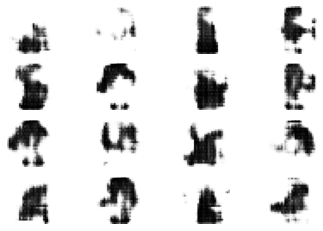



epoch -> [2/200], discriminator_loss_for_real_data = 592.45, discriminator_loss_for_fake_data = 581.10, generator_loss = 828.45



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  This is separate from the ipykernel package so we can avoid doing imports until


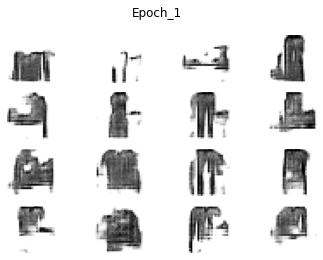



epoch -> [3/200], discriminator_loss_for_real_data = 610.64, discriminator_loss_for_fake_data = 605.23, generator_loss = 784.45



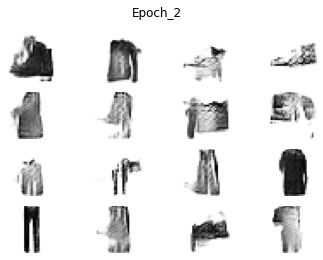



epoch -> [4/200], discriminator_loss_for_real_data = 617.16, discriminator_loss_for_fake_data = 624.08, generator_loss = 732.49



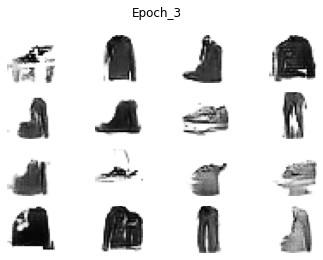



epoch -> [5/200], discriminator_loss_for_real_data = 622.85, discriminator_loss_for_fake_data = 629.55, generator_loss = 719.30



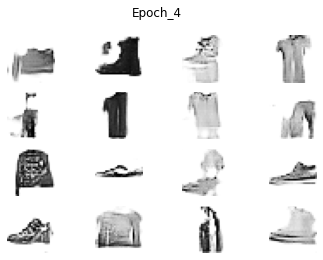



epoch -> [6/200], discriminator_loss_for_real_data = 627.26, discriminator_loss_for_fake_data = 631.51, generator_loss = 713.05



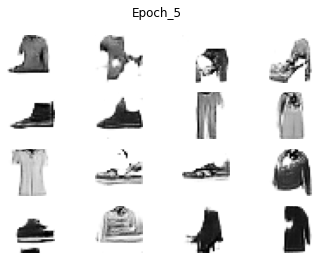



epoch -> [7/200], discriminator_loss_for_real_data = 626.15, discriminator_loss_for_fake_data = 631.05, generator_loss = 709.31



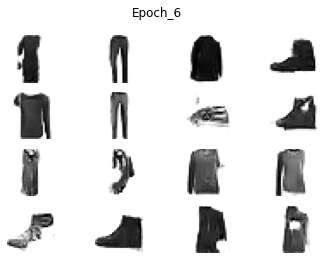



epoch -> [8/200], discriminator_loss_for_real_data = 625.24, discriminator_loss_for_fake_data = 628.64, generator_loss = 715.77



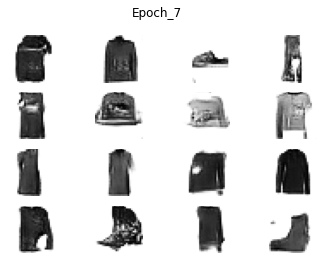



epoch -> [9/200], discriminator_loss_for_real_data = 623.93, discriminator_loss_for_fake_data = 626.02, generator_loss = 718.76



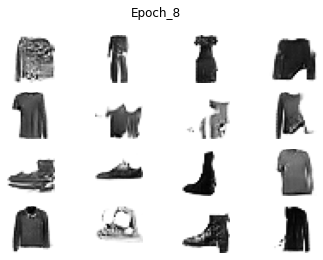



epoch -> [10/200], discriminator_loss_for_real_data = 620.57, discriminator_loss_for_fake_data = 622.33, generator_loss = 726.08



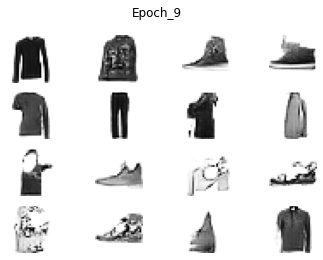



epoch -> [11/200], discriminator_loss_for_real_data = 618.88, discriminator_loss_for_fake_data = 620.19, generator_loss = 729.74



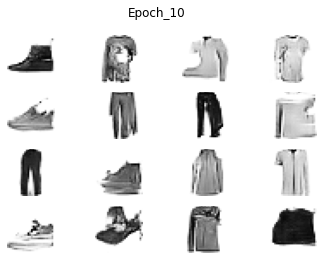



epoch -> [12/200], discriminator_loss_for_real_data = 616.03, discriminator_loss_for_fake_data = 616.70, generator_loss = 735.93



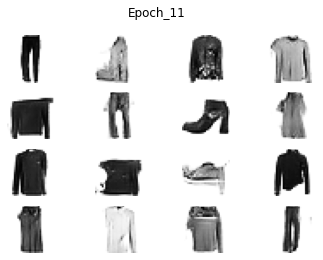



epoch -> [13/200], discriminator_loss_for_real_data = 617.25, discriminator_loss_for_fake_data = 614.98, generator_loss = 737.87



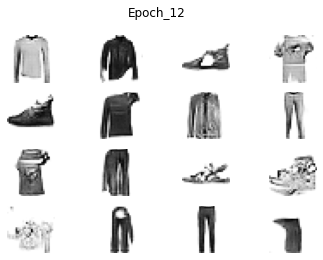



epoch -> [14/200], discriminator_loss_for_real_data = 615.06, discriminator_loss_for_fake_data = 613.60, generator_loss = 739.71



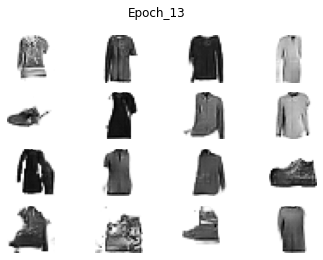



epoch -> [15/200], discriminator_loss_for_real_data = 612.52, discriminator_loss_for_fake_data = 611.46, generator_loss = 745.41



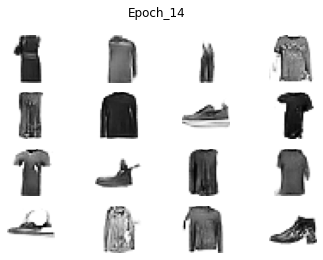



epoch -> [16/200], discriminator_loss_for_real_data = 611.36, discriminator_loss_for_fake_data = 610.01, generator_loss = 748.51



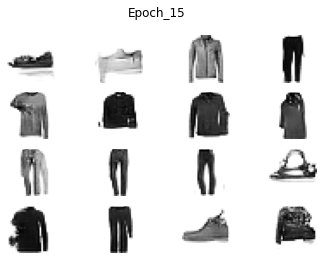



epoch -> [17/200], discriminator_loss_for_real_data = 610.31, discriminator_loss_for_fake_data = 608.53, generator_loss = 754.57



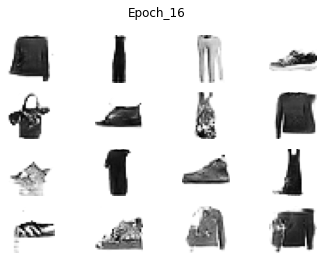



epoch -> [18/200], discriminator_loss_for_real_data = 611.17, discriminator_loss_for_fake_data = 606.21, generator_loss = 761.53



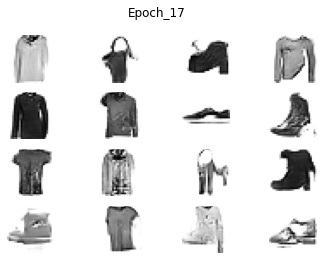



epoch -> [19/200], discriminator_loss_for_real_data = 607.94, discriminator_loss_for_fake_data = 603.56, generator_loss = 764.02



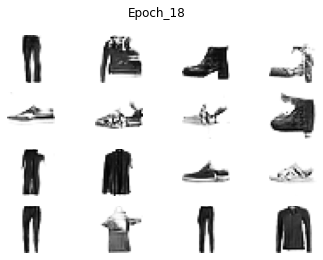



epoch -> [20/200], discriminator_loss_for_real_data = 605.60, discriminator_loss_for_fake_data = 601.55, generator_loss = 769.26



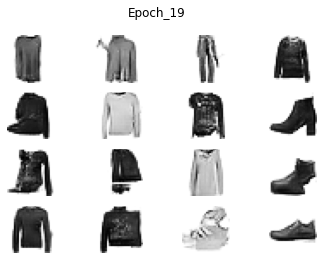



epoch -> [21/200], discriminator_loss_for_real_data = 603.65, discriminator_loss_for_fake_data = 598.84, generator_loss = 775.97



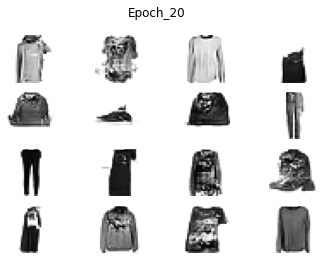



epoch -> [22/200], discriminator_loss_for_real_data = 601.68, discriminator_loss_for_fake_data = 597.48, generator_loss = 781.88



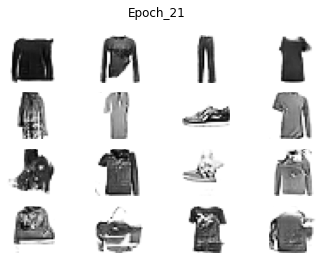



epoch -> [23/200], discriminator_loss_for_real_data = 600.30, discriminator_loss_for_fake_data = 593.85, generator_loss = 784.94



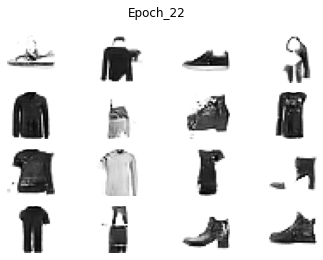



epoch -> [24/200], discriminator_loss_for_real_data = 599.24, discriminator_loss_for_fake_data = 592.81, generator_loss = 789.57



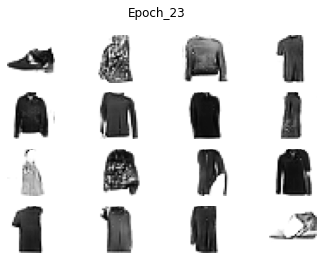



epoch -> [25/200], discriminator_loss_for_real_data = 597.73, discriminator_loss_for_fake_data = 589.20, generator_loss = 799.84



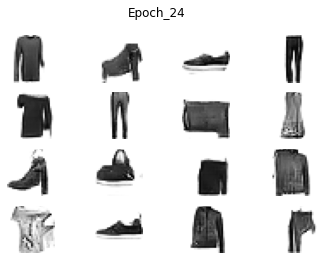



epoch -> [26/200], discriminator_loss_for_real_data = 595.12, discriminator_loss_for_fake_data = 586.89, generator_loss = 803.53



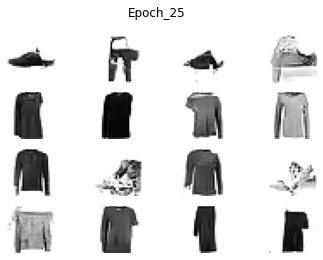



epoch -> [27/200], discriminator_loss_for_real_data = 593.71, discriminator_loss_for_fake_data = 586.02, generator_loss = 807.72



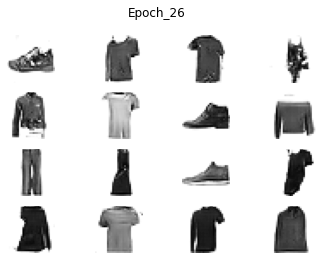



epoch -> [28/200], discriminator_loss_for_real_data = 590.88, discriminator_loss_for_fake_data = 581.30, generator_loss = 817.07



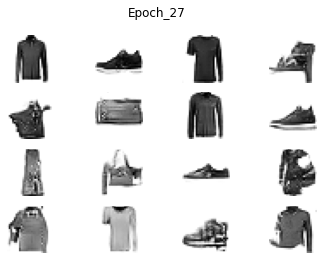



epoch -> [29/200], discriminator_loss_for_real_data = 587.81, discriminator_loss_for_fake_data = 577.06, generator_loss = 823.83



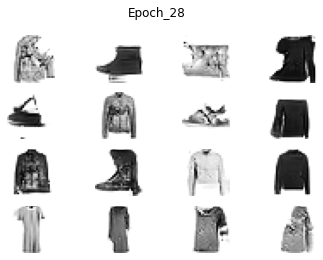



epoch -> [30/200], discriminator_loss_for_real_data = 587.65, discriminator_loss_for_fake_data = 577.45, generator_loss = 827.96



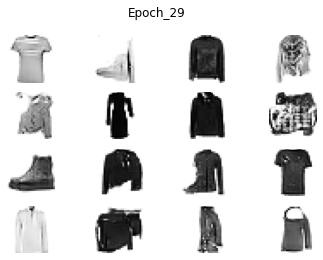



epoch -> [31/200], discriminator_loss_for_real_data = 585.99, discriminator_loss_for_fake_data = 575.21, generator_loss = 834.28



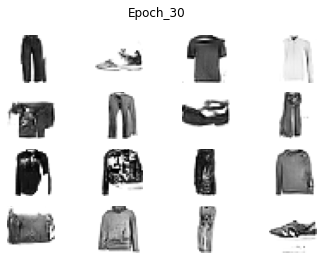



epoch -> [32/200], discriminator_loss_for_real_data = 582.56, discriminator_loss_for_fake_data = 568.58, generator_loss = 841.82



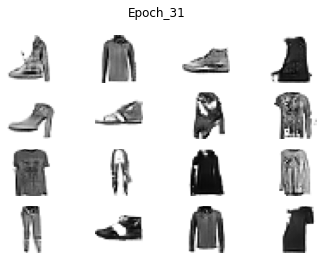



epoch -> [33/200], discriminator_loss_for_real_data = 581.71, discriminator_loss_for_fake_data = 570.22, generator_loss = 846.95



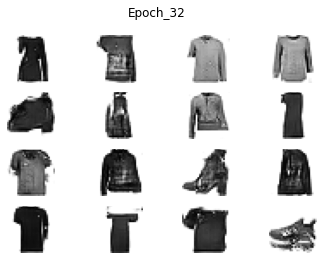



epoch -> [34/200], discriminator_loss_for_real_data = 580.86, discriminator_loss_for_fake_data = 567.22, generator_loss = 853.89



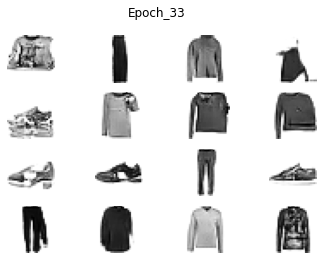



epoch -> [35/200], discriminator_loss_for_real_data = 576.78, discriminator_loss_for_fake_data = 563.41, generator_loss = 863.73



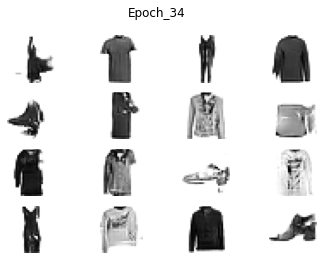



epoch -> [36/200], discriminator_loss_for_real_data = 576.47, discriminator_loss_for_fake_data = 561.57, generator_loss = 870.91



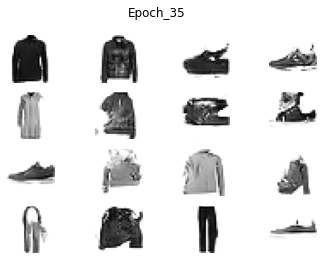



epoch -> [37/200], discriminator_loss_for_real_data = 571.96, discriminator_loss_for_fake_data = 557.30, generator_loss = 878.66



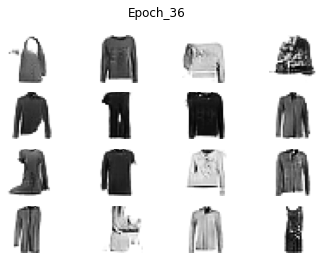



epoch -> [38/200], discriminator_loss_for_real_data = 569.00, discriminator_loss_for_fake_data = 555.01, generator_loss = 881.66



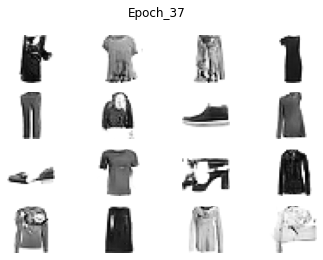



epoch -> [39/200], discriminator_loss_for_real_data = 569.93, discriminator_loss_for_fake_data = 554.87, generator_loss = 888.93



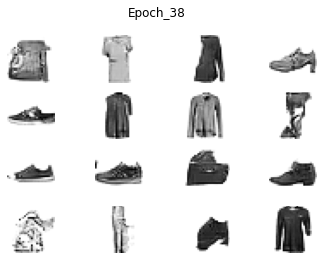



epoch -> [40/200], discriminator_loss_for_real_data = 568.76, discriminator_loss_for_fake_data = 553.33, generator_loss = 895.28



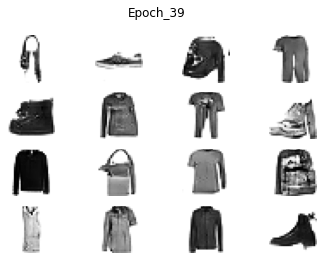



epoch -> [41/200], discriminator_loss_for_real_data = 566.65, discriminator_loss_for_fake_data = 549.54, generator_loss = 902.45



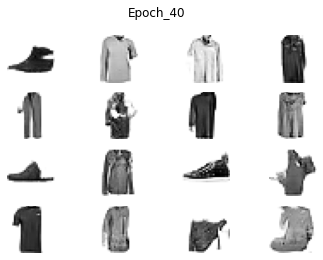



epoch -> [42/200], discriminator_loss_for_real_data = 562.80, discriminator_loss_for_fake_data = 547.13, generator_loss = 909.11



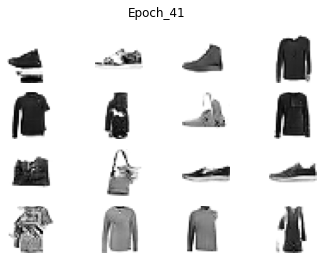



epoch -> [43/200], discriminator_loss_for_real_data = 562.67, discriminator_loss_for_fake_data = 543.74, generator_loss = 920.17



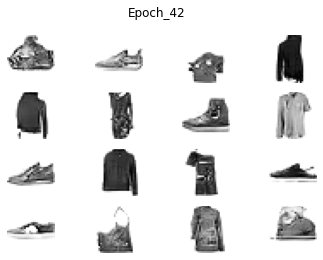



epoch -> [44/200], discriminator_loss_for_real_data = 561.68, discriminator_loss_for_fake_data = 541.35, generator_loss = 925.87



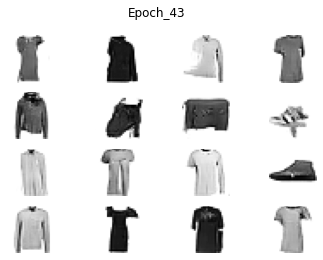



epoch -> [45/200], discriminator_loss_for_real_data = 557.84, discriminator_loss_for_fake_data = 539.79, generator_loss = 927.35



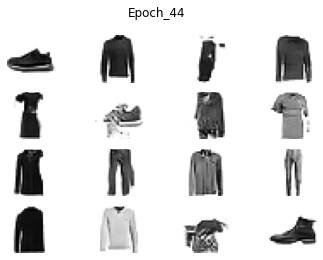



epoch -> [46/200], discriminator_loss_for_real_data = 557.94, discriminator_loss_for_fake_data = 539.20, generator_loss = 933.98



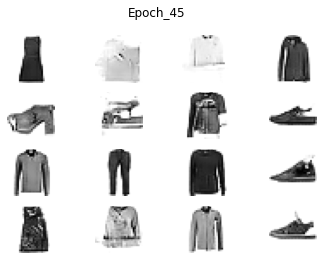



epoch -> [47/200], discriminator_loss_for_real_data = 554.81, discriminator_loss_for_fake_data = 533.81, generator_loss = 948.36



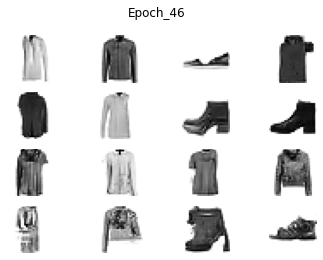



epoch -> [48/200], discriminator_loss_for_real_data = 549.52, discriminator_loss_for_fake_data = 531.00, generator_loss = 952.65



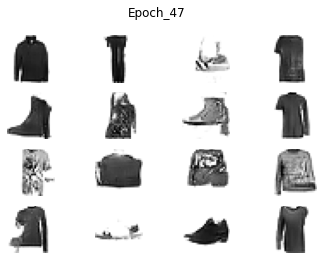



epoch -> [49/200], discriminator_loss_for_real_data = 551.09, discriminator_loss_for_fake_data = 530.39, generator_loss = 959.74



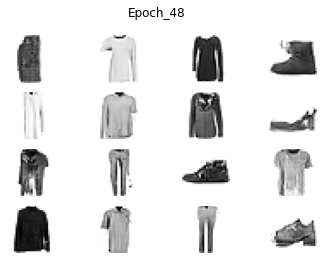



epoch -> [50/200], discriminator_loss_for_real_data = 550.50, discriminator_loss_for_fake_data = 526.81, generator_loss = 969.86



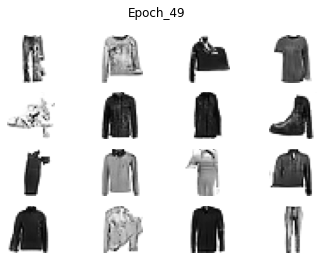



epoch -> [51/200], discriminator_loss_for_real_data = 546.31, discriminator_loss_for_fake_data = 525.56, generator_loss = 968.41



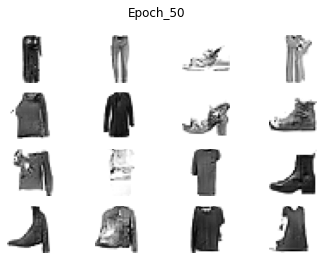



epoch -> [52/200], discriminator_loss_for_real_data = 546.05, discriminator_loss_for_fake_data = 525.32, generator_loss = 978.48



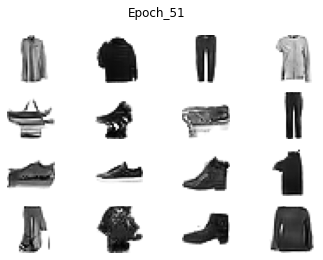



epoch -> [53/200], discriminator_loss_for_real_data = 543.21, discriminator_loss_for_fake_data = 521.24, generator_loss = 980.82



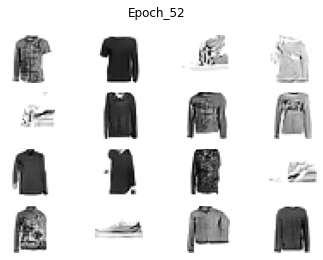



epoch -> [54/200], discriminator_loss_for_real_data = 539.61, discriminator_loss_for_fake_data = 516.95, generator_loss = 994.33



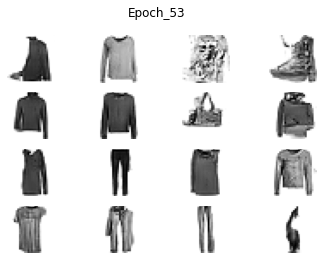



epoch -> [55/200], discriminator_loss_for_real_data = 538.87, discriminator_loss_for_fake_data = 514.34, generator_loss = 1001.84



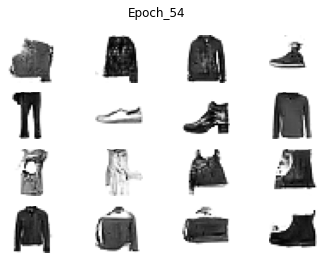



epoch -> [56/200], discriminator_loss_for_real_data = 536.50, discriminator_loss_for_fake_data = 513.73, generator_loss = 1008.28



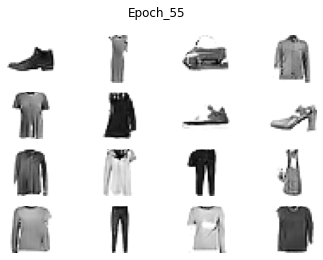



epoch -> [57/200], discriminator_loss_for_real_data = 536.94, discriminator_loss_for_fake_data = 511.40, generator_loss = 1012.30



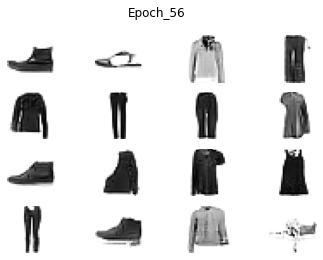



epoch -> [58/200], discriminator_loss_for_real_data = 534.84, discriminator_loss_for_fake_data = 512.58, generator_loss = 1015.33



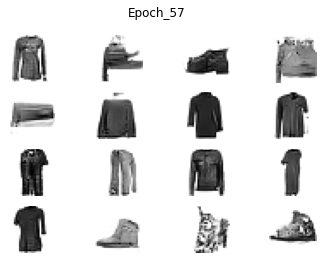



epoch -> [59/200], discriminator_loss_for_real_data = 536.18, discriminator_loss_for_fake_data = 511.10, generator_loss = 1016.59



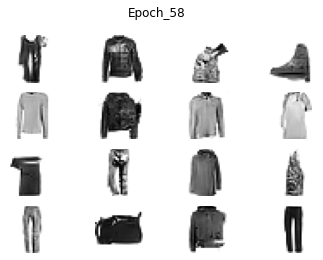



epoch -> [60/200], discriminator_loss_for_real_data = 531.05, discriminator_loss_for_fake_data = 507.24, generator_loss = 1028.40



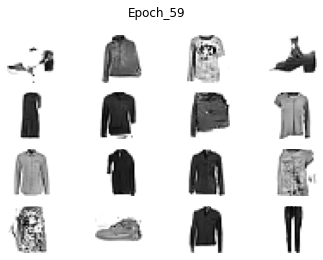



epoch -> [61/200], discriminator_loss_for_real_data = 531.32, discriminator_loss_for_fake_data = 506.38, generator_loss = 1034.90



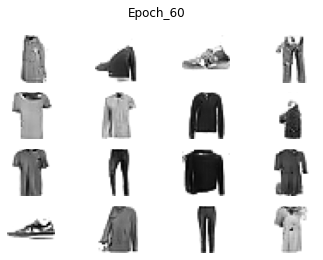



epoch -> [62/200], discriminator_loss_for_real_data = 527.71, discriminator_loss_for_fake_data = 501.32, generator_loss = 1054.11



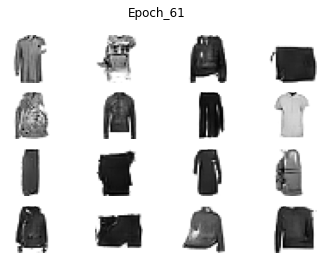



epoch -> [63/200], discriminator_loss_for_real_data = 527.41, discriminator_loss_for_fake_data = 500.99, generator_loss = 1049.77



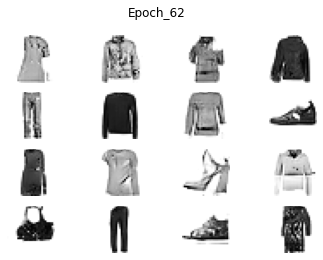



epoch -> [64/200], discriminator_loss_for_real_data = 523.36, discriminator_loss_for_fake_data = 496.97, generator_loss = 1057.87



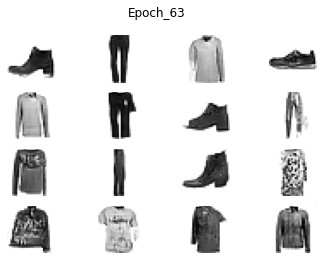



epoch -> [65/200], discriminator_loss_for_real_data = 521.29, discriminator_loss_for_fake_data = 493.08, generator_loss = 1076.00



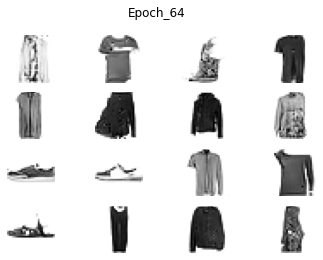



epoch -> [66/200], discriminator_loss_for_real_data = 522.64, discriminator_loss_for_fake_data = 495.72, generator_loss = 1079.13



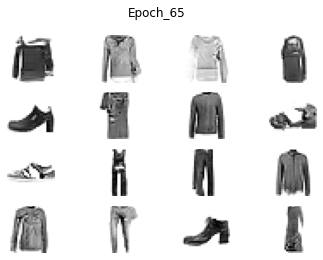



epoch -> [67/200], discriminator_loss_for_real_data = 519.38, discriminator_loss_for_fake_data = 491.06, generator_loss = 1080.65



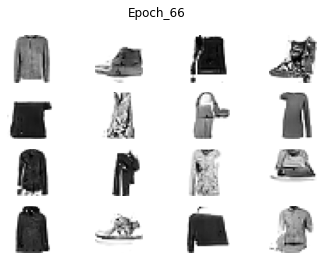



epoch -> [68/200], discriminator_loss_for_real_data = 520.59, discriminator_loss_for_fake_data = 491.93, generator_loss = 1082.91



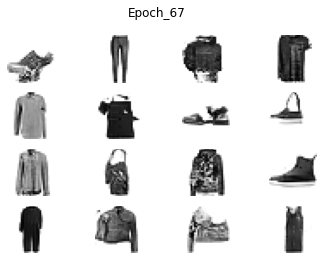



epoch -> [69/200], discriminator_loss_for_real_data = 514.73, discriminator_loss_for_fake_data = 487.33, generator_loss = 1089.26



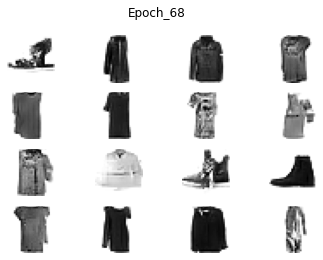



epoch -> [70/200], discriminator_loss_for_real_data = 515.34, discriminator_loss_for_fake_data = 490.18, generator_loss = 1092.85



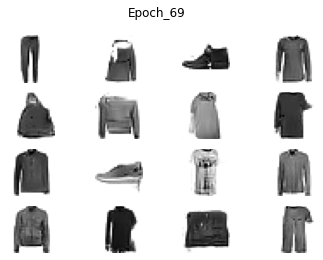



epoch -> [71/200], discriminator_loss_for_real_data = 510.39, discriminator_loss_for_fake_data = 483.62, generator_loss = 1097.06



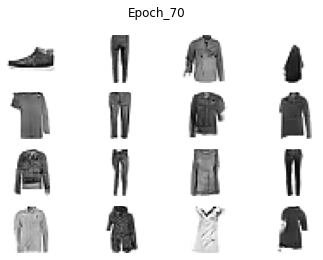



epoch -> [72/200], discriminator_loss_for_real_data = 512.61, discriminator_loss_for_fake_data = 484.54, generator_loss = 1108.93



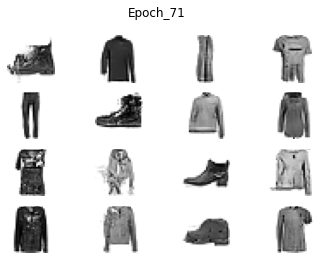



epoch -> [73/200], discriminator_loss_for_real_data = 512.20, discriminator_loss_for_fake_data = 480.24, generator_loss = 1117.76



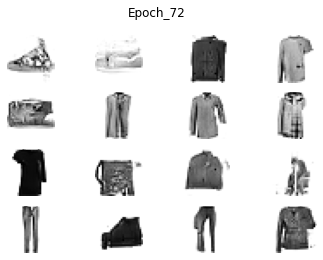



epoch -> [74/200], discriminator_loss_for_real_data = 511.14, discriminator_loss_for_fake_data = 481.91, generator_loss = 1121.23



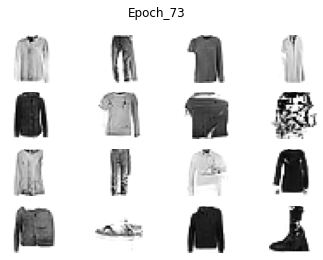



epoch -> [75/200], discriminator_loss_for_real_data = 508.51, discriminator_loss_for_fake_data = 476.45, generator_loss = 1126.22



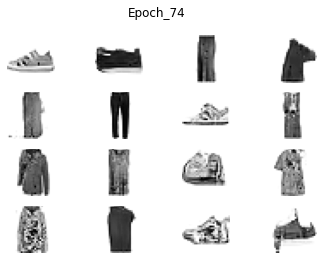



epoch -> [76/200], discriminator_loss_for_real_data = 503.60, discriminator_loss_for_fake_data = 475.31, generator_loss = 1138.03



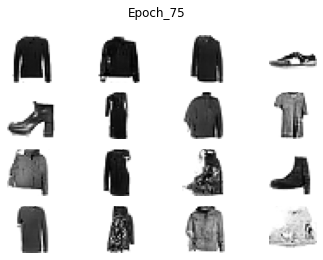



epoch -> [77/200], discriminator_loss_for_real_data = 505.18, discriminator_loss_for_fake_data = 474.82, generator_loss = 1137.35



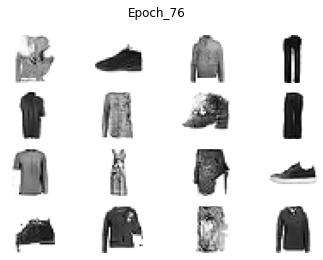



epoch -> [78/200], discriminator_loss_for_real_data = 504.80, discriminator_loss_for_fake_data = 473.97, generator_loss = 1150.01



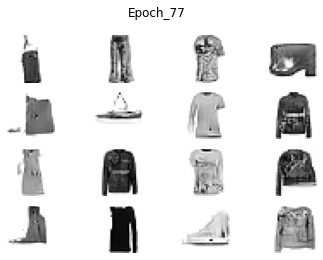



epoch -> [79/200], discriminator_loss_for_real_data = 502.89, discriminator_loss_for_fake_data = 472.55, generator_loss = 1155.31



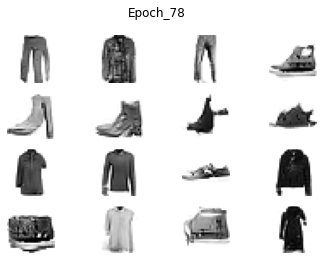



epoch -> [80/200], discriminator_loss_for_real_data = 503.55, discriminator_loss_for_fake_data = 473.80, generator_loss = 1156.52



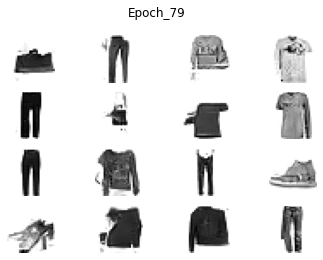



epoch -> [81/200], discriminator_loss_for_real_data = 495.13, discriminator_loss_for_fake_data = 465.37, generator_loss = 1172.15



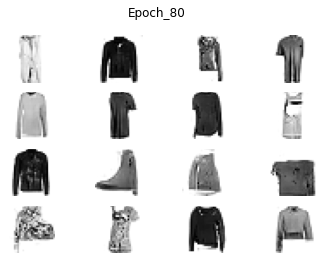



epoch -> [82/200], discriminator_loss_for_real_data = 500.05, discriminator_loss_for_fake_data = 470.29, generator_loss = 1161.99



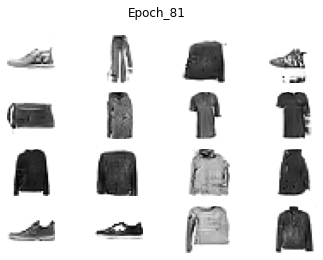



epoch -> [83/200], discriminator_loss_for_real_data = 500.31, discriminator_loss_for_fake_data = 468.67, generator_loss = 1170.95



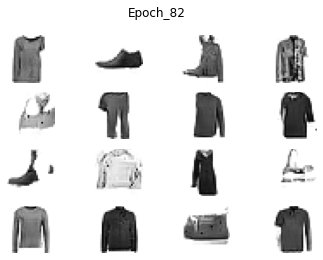



epoch -> [84/200], discriminator_loss_for_real_data = 496.35, discriminator_loss_for_fake_data = 465.44, generator_loss = 1179.32



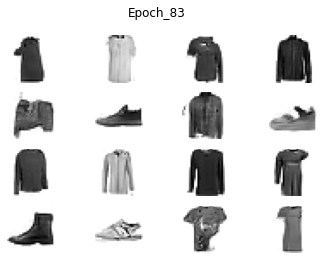



epoch -> [85/200], discriminator_loss_for_real_data = 497.11, discriminator_loss_for_fake_data = 468.44, generator_loss = 1186.49



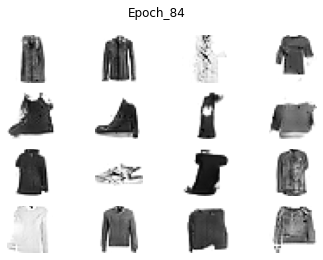



epoch -> [86/200], discriminator_loss_for_real_data = 494.81, discriminator_loss_for_fake_data = 466.98, generator_loss = 1186.30



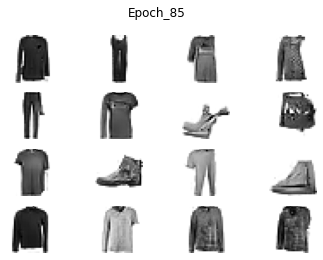



epoch -> [87/200], discriminator_loss_for_real_data = 494.65, discriminator_loss_for_fake_data = 462.56, generator_loss = 1200.25



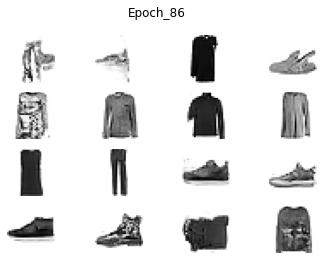



epoch -> [88/200], discriminator_loss_for_real_data = 494.32, discriminator_loss_for_fake_data = 462.31, generator_loss = 1199.42



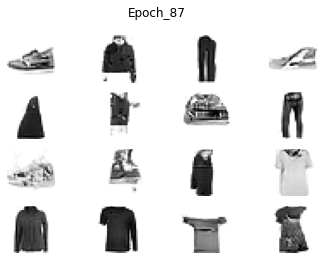



epoch -> [89/200], discriminator_loss_for_real_data = 492.84, discriminator_loss_for_fake_data = 462.36, generator_loss = 1198.41



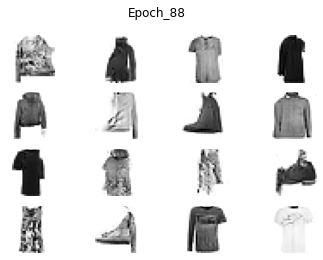



epoch -> [90/200], discriminator_loss_for_real_data = 496.21, discriminator_loss_for_fake_data = 464.22, generator_loss = 1197.91



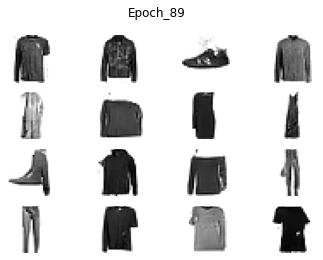



epoch -> [91/200], discriminator_loss_for_real_data = 491.42, discriminator_loss_for_fake_data = 461.55, generator_loss = 1209.35



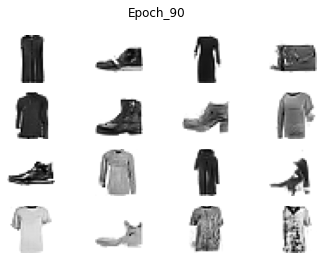



epoch -> [92/200], discriminator_loss_for_real_data = 491.63, discriminator_loss_for_fake_data = 459.21, generator_loss = 1207.80



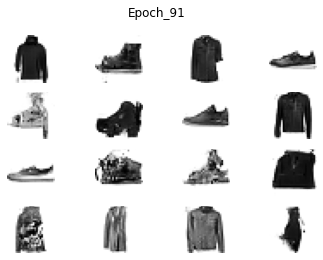



epoch -> [93/200], discriminator_loss_for_real_data = 489.54, discriminator_loss_for_fake_data = 458.08, generator_loss = 1222.99



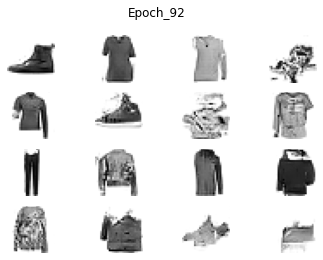



epoch -> [94/200], discriminator_loss_for_real_data = 487.77, discriminator_loss_for_fake_data = 456.08, generator_loss = 1217.11



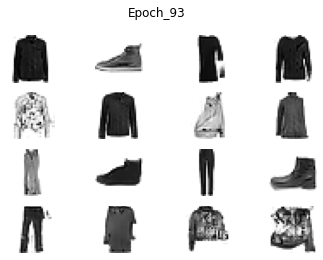



epoch -> [95/200], discriminator_loss_for_real_data = 486.22, discriminator_loss_for_fake_data = 452.41, generator_loss = 1234.08



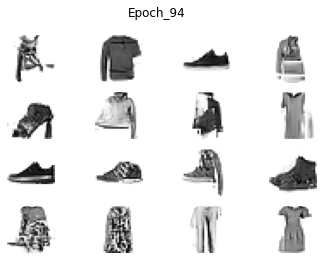



epoch -> [96/200], discriminator_loss_for_real_data = 488.05, discriminator_loss_for_fake_data = 456.83, generator_loss = 1230.50



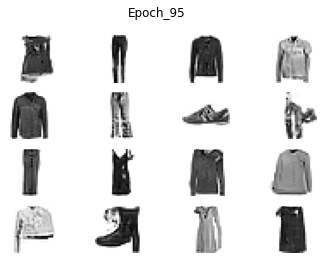



epoch -> [97/200], discriminator_loss_for_real_data = 486.99, discriminator_loss_for_fake_data = 455.59, generator_loss = 1231.28



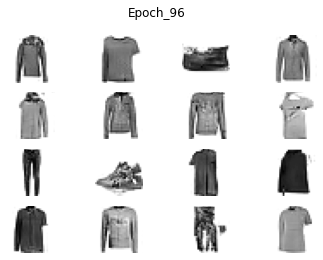



epoch -> [98/200], discriminator_loss_for_real_data = 483.29, discriminator_loss_for_fake_data = 452.79, generator_loss = 1243.47



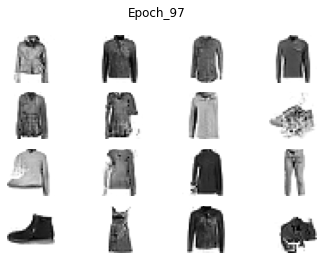



epoch -> [99/200], discriminator_loss_for_real_data = 487.42, discriminator_loss_for_fake_data = 457.47, generator_loss = 1233.86



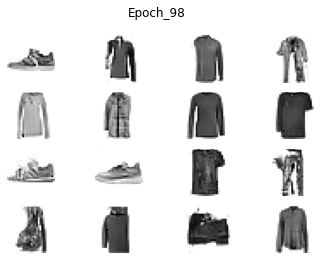



epoch -> [100/200], discriminator_loss_for_real_data = 485.47, discriminator_loss_for_fake_data = 453.35, generator_loss = 1240.61



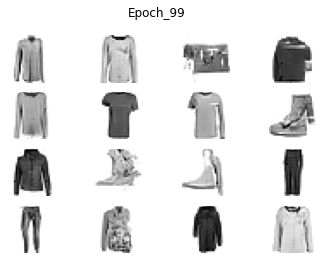



epoch -> [101/200], discriminator_loss_for_real_data = 480.95, discriminator_loss_for_fake_data = 449.03, generator_loss = 1254.96



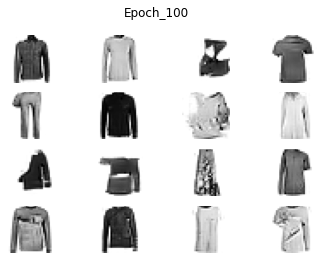



epoch -> [102/200], discriminator_loss_for_real_data = 483.15, discriminator_loss_for_fake_data = 453.59, generator_loss = 1257.26



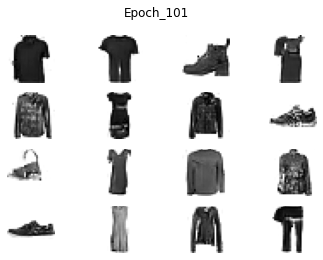



epoch -> [103/200], discriminator_loss_for_real_data = 480.96, discriminator_loss_for_fake_data = 447.32, generator_loss = 1263.50



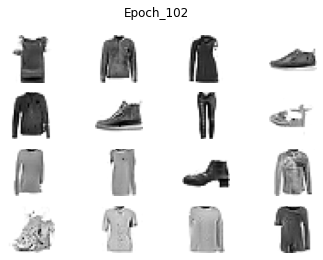



epoch -> [104/200], discriminator_loss_for_real_data = 478.23, discriminator_loss_for_fake_data = 448.58, generator_loss = 1266.78



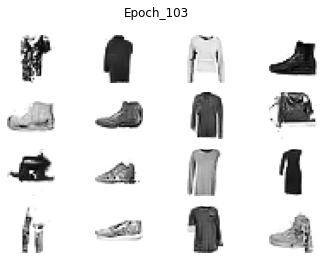



epoch -> [105/200], discriminator_loss_for_real_data = 480.95, discriminator_loss_for_fake_data = 447.60, generator_loss = 1259.90



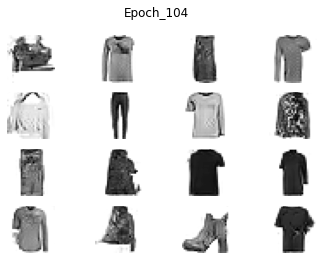



epoch -> [106/200], discriminator_loss_for_real_data = 480.59, discriminator_loss_for_fake_data = 445.65, generator_loss = 1269.12



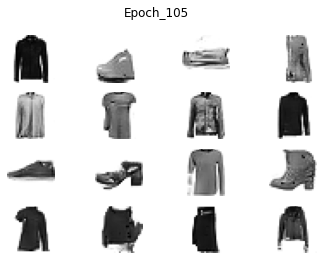



epoch -> [107/200], discriminator_loss_for_real_data = 474.30, discriminator_loss_for_fake_data = 442.78, generator_loss = 1284.36



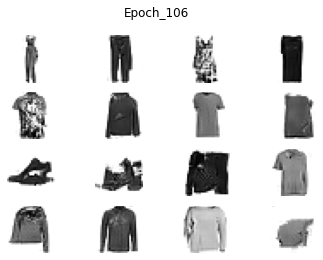



epoch -> [108/200], discriminator_loss_for_real_data = 474.68, discriminator_loss_for_fake_data = 441.14, generator_loss = 1295.08



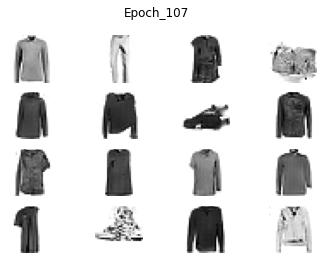



epoch -> [109/200], discriminator_loss_for_real_data = 471.69, discriminator_loss_for_fake_data = 437.05, generator_loss = 1304.00



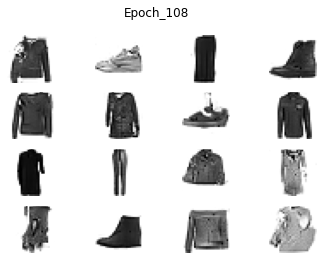



epoch -> [110/200], discriminator_loss_for_real_data = 468.87, discriminator_loss_for_fake_data = 433.54, generator_loss = 1309.78



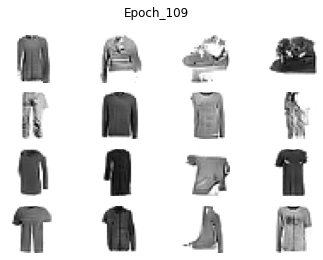



epoch -> [111/200], discriminator_loss_for_real_data = 466.81, discriminator_loss_for_fake_data = 433.88, generator_loss = 1302.25



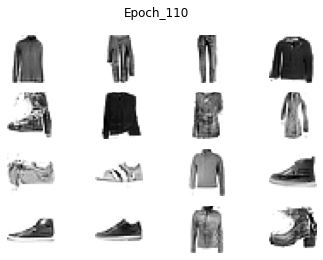



epoch -> [112/200], discriminator_loss_for_real_data = 471.45, discriminator_loss_for_fake_data = 436.02, generator_loss = 1309.48



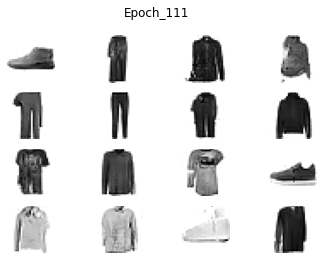



epoch -> [113/200], discriminator_loss_for_real_data = 471.71, discriminator_loss_for_fake_data = 435.53, generator_loss = 1307.52



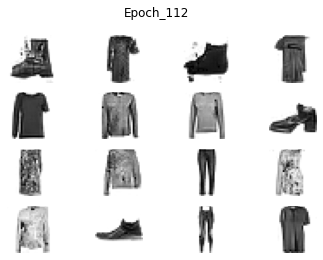



epoch -> [114/200], discriminator_loss_for_real_data = 468.27, discriminator_loss_for_fake_data = 435.55, generator_loss = 1322.23



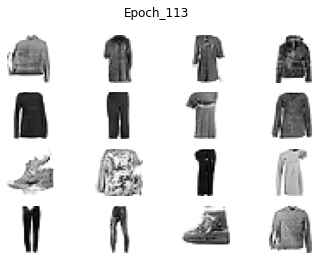



epoch -> [115/200], discriminator_loss_for_real_data = 470.10, discriminator_loss_for_fake_data = 436.97, generator_loss = 1323.87



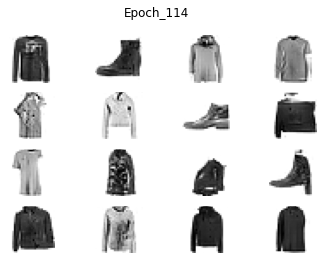



epoch -> [116/200], discriminator_loss_for_real_data = 464.89, discriminator_loss_for_fake_data = 430.93, generator_loss = 1324.84



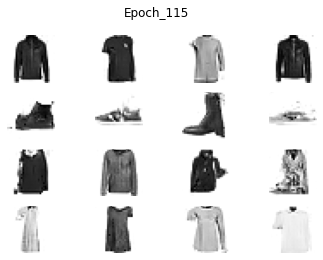



epoch -> [117/200], discriminator_loss_for_real_data = 466.57, discriminator_loss_for_fake_data = 432.99, generator_loss = 1347.59



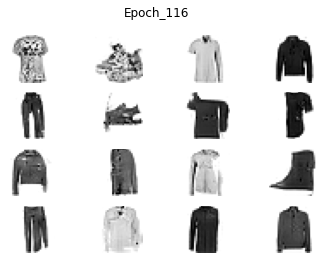



epoch -> [118/200], discriminator_loss_for_real_data = 464.20, discriminator_loss_for_fake_data = 428.86, generator_loss = 1350.08



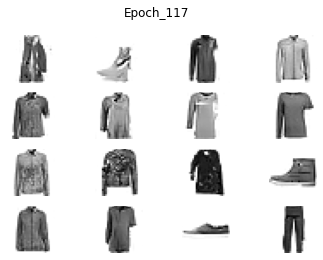



epoch -> [119/200], discriminator_loss_for_real_data = 462.12, discriminator_loss_for_fake_data = 428.20, generator_loss = 1350.22



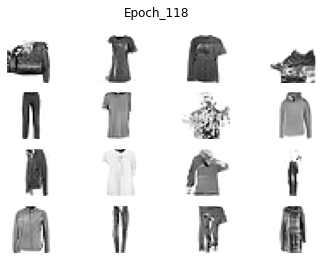



epoch -> [120/200], discriminator_loss_for_real_data = 466.87, discriminator_loss_for_fake_data = 430.65, generator_loss = 1344.79



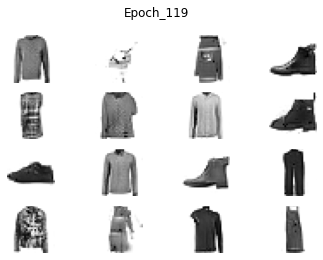



epoch -> [121/200], discriminator_loss_for_real_data = 461.37, discriminator_loss_for_fake_data = 428.33, generator_loss = 1353.32



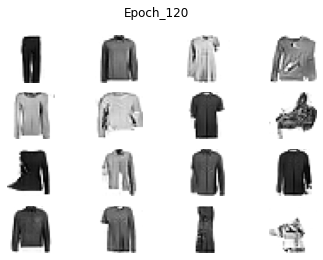



epoch -> [122/200], discriminator_loss_for_real_data = 457.91, discriminator_loss_for_fake_data = 424.09, generator_loss = 1364.22



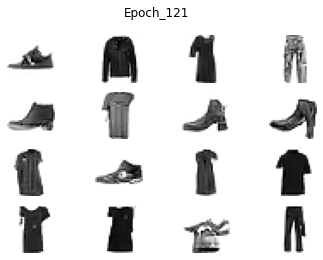



epoch -> [123/200], discriminator_loss_for_real_data = 459.59, discriminator_loss_for_fake_data = 425.55, generator_loss = 1367.15



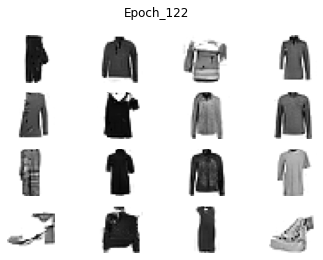



epoch -> [124/200], discriminator_loss_for_real_data = 463.14, discriminator_loss_for_fake_data = 424.44, generator_loss = 1375.59



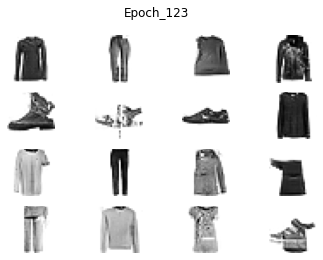



epoch -> [125/200], discriminator_loss_for_real_data = 457.38, discriminator_loss_for_fake_data = 423.24, generator_loss = 1377.66



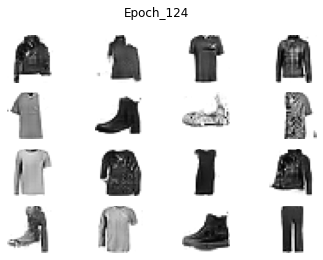



epoch -> [126/200], discriminator_loss_for_real_data = 457.30, discriminator_loss_for_fake_data = 421.38, generator_loss = 1378.82



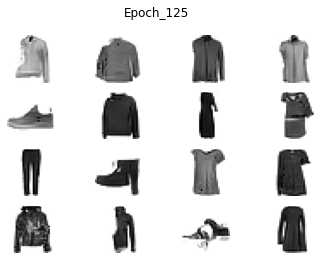



epoch -> [127/200], discriminator_loss_for_real_data = 458.87, discriminator_loss_for_fake_data = 423.45, generator_loss = 1386.89



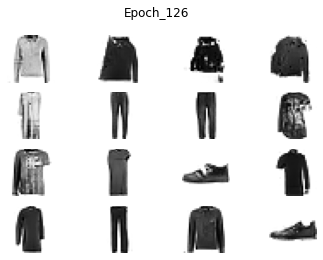



epoch -> [128/200], discriminator_loss_for_real_data = 454.60, discriminator_loss_for_fake_data = 425.31, generator_loss = 1383.76



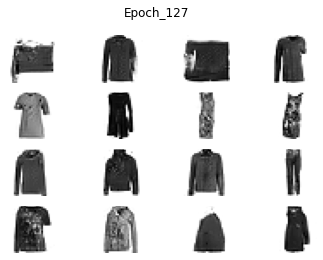



epoch -> [129/200], discriminator_loss_for_real_data = 458.07, discriminator_loss_for_fake_data = 423.96, generator_loss = 1381.21



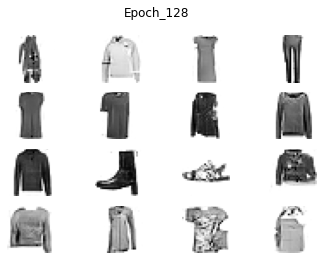



epoch -> [130/200], discriminator_loss_for_real_data = 455.24, discriminator_loss_for_fake_data = 420.37, generator_loss = 1392.27



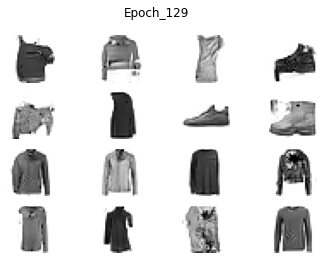



epoch -> [131/200], discriminator_loss_for_real_data = 456.69, discriminator_loss_for_fake_data = 422.42, generator_loss = 1396.48



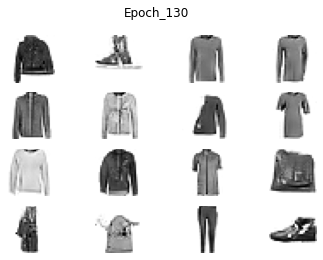



epoch -> [132/200], discriminator_loss_for_real_data = 451.34, discriminator_loss_for_fake_data = 417.00, generator_loss = 1408.92



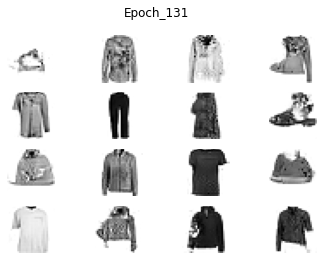



epoch -> [133/200], discriminator_loss_for_real_data = 452.55, discriminator_loss_for_fake_data = 419.23, generator_loss = 1400.12



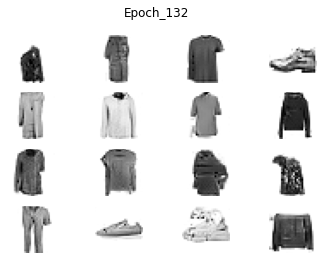



epoch -> [134/200], discriminator_loss_for_real_data = 452.63, discriminator_loss_for_fake_data = 417.51, generator_loss = 1414.17



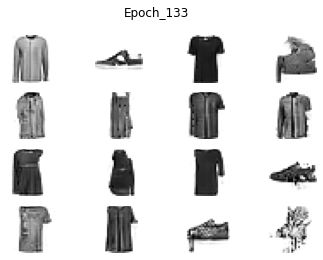



epoch -> [135/200], discriminator_loss_for_real_data = 454.05, discriminator_loss_for_fake_data = 419.82, generator_loss = 1405.71



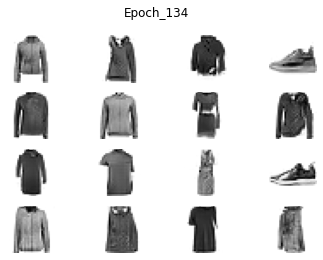



epoch -> [136/200], discriminator_loss_for_real_data = 451.80, discriminator_loss_for_fake_data = 416.82, generator_loss = 1417.08



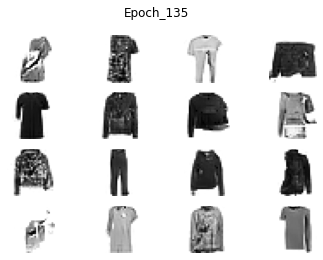



epoch -> [137/200], discriminator_loss_for_real_data = 445.32, discriminator_loss_for_fake_data = 409.79, generator_loss = 1441.09



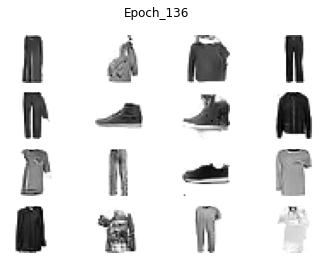



epoch -> [138/200], discriminator_loss_for_real_data = 443.47, discriminator_loss_for_fake_data = 409.82, generator_loss = 1440.93



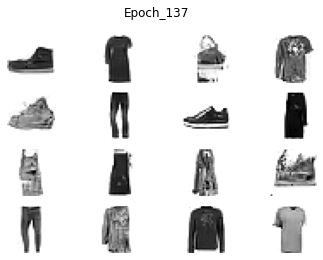



epoch -> [139/200], discriminator_loss_for_real_data = 446.37, discriminator_loss_for_fake_data = 413.21, generator_loss = 1446.85



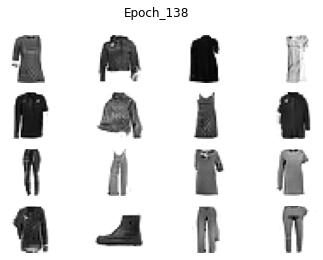



epoch -> [140/200], discriminator_loss_for_real_data = 444.01, discriminator_loss_for_fake_data = 408.50, generator_loss = 1457.26



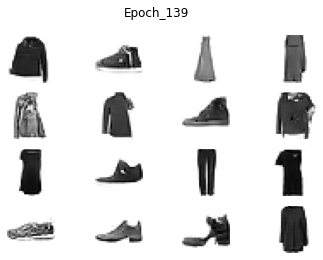



epoch -> [141/200], discriminator_loss_for_real_data = 444.84, discriminator_loss_for_fake_data = 411.43, generator_loss = 1438.77



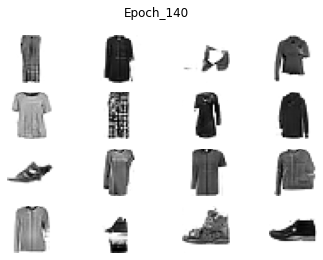



epoch -> [142/200], discriminator_loss_for_real_data = 442.30, discriminator_loss_for_fake_data = 407.08, generator_loss = 1456.05



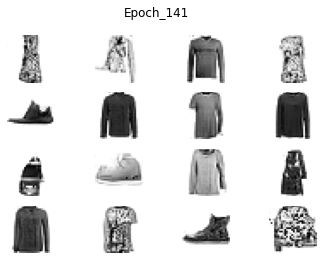



epoch -> [143/200], discriminator_loss_for_real_data = 439.56, discriminator_loss_for_fake_data = 405.73, generator_loss = 1462.05



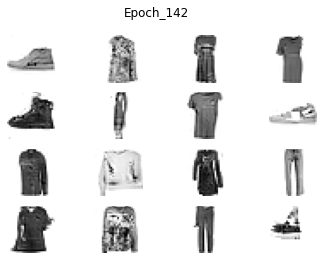



epoch -> [144/200], discriminator_loss_for_real_data = 440.68, discriminator_loss_for_fake_data = 401.75, generator_loss = 1467.20



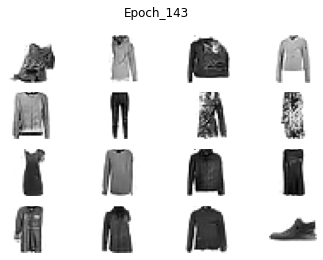



epoch -> [145/200], discriminator_loss_for_real_data = 442.90, discriminator_loss_for_fake_data = 406.93, generator_loss = 1473.55



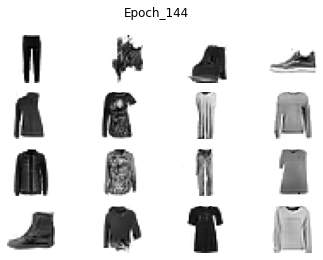



epoch -> [146/200], discriminator_loss_for_real_data = 437.96, discriminator_loss_for_fake_data = 405.34, generator_loss = 1469.69



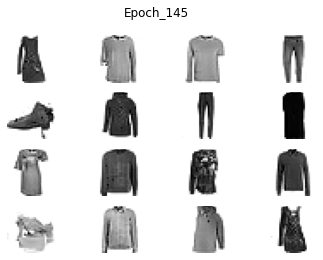



epoch -> [147/200], discriminator_loss_for_real_data = 439.24, discriminator_loss_for_fake_data = 405.16, generator_loss = 1485.54



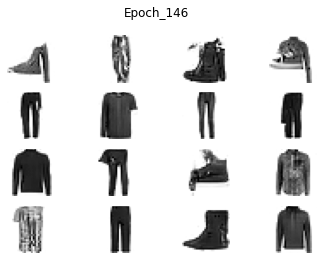



epoch -> [148/200], discriminator_loss_for_real_data = 438.28, discriminator_loss_for_fake_data = 403.87, generator_loss = 1476.47



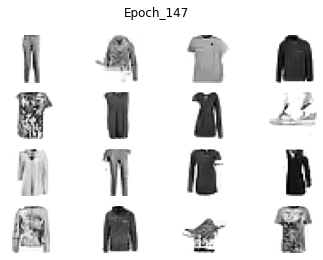



epoch -> [149/200], discriminator_loss_for_real_data = 439.43, discriminator_loss_for_fake_data = 405.28, generator_loss = 1478.36



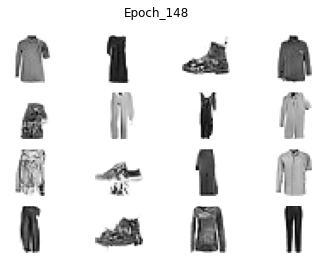



epoch -> [150/200], discriminator_loss_for_real_data = 437.63, discriminator_loss_for_fake_data = 401.39, generator_loss = 1478.73



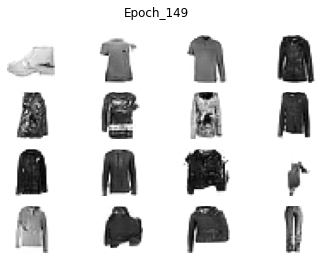



epoch -> [151/200], discriminator_loss_for_real_data = 438.06, discriminator_loss_for_fake_data = 403.30, generator_loss = 1488.97



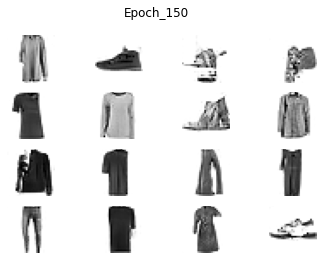



epoch -> [152/200], discriminator_loss_for_real_data = 437.62, discriminator_loss_for_fake_data = 402.98, generator_loss = 1497.10



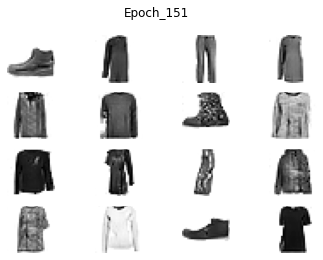



epoch -> [153/200], discriminator_loss_for_real_data = 434.00, discriminator_loss_for_fake_data = 400.54, generator_loss = 1505.57



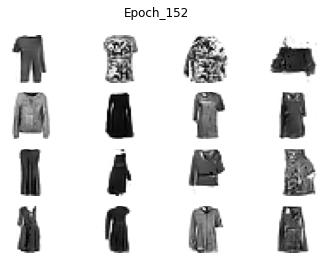



epoch -> [154/200], discriminator_loss_for_real_data = 431.62, discriminator_loss_for_fake_data = 396.91, generator_loss = 1505.99



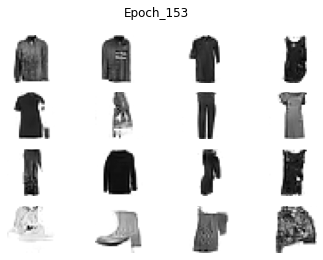



epoch -> [155/200], discriminator_loss_for_real_data = 434.61, discriminator_loss_for_fake_data = 395.09, generator_loss = 1510.02



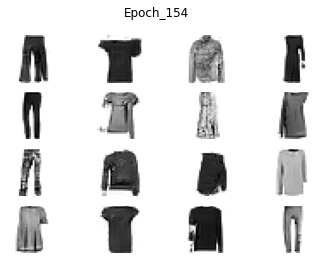



epoch -> [156/200], discriminator_loss_for_real_data = 433.80, discriminator_loss_for_fake_data = 396.82, generator_loss = 1515.61



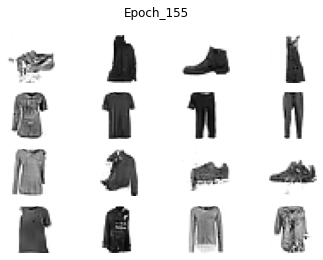



epoch -> [157/200], discriminator_loss_for_real_data = 430.09, discriminator_loss_for_fake_data = 392.45, generator_loss = 1527.74



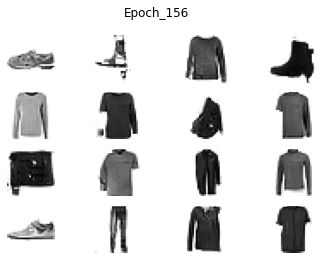



epoch -> [158/200], discriminator_loss_for_real_data = 429.90, discriminator_loss_for_fake_data = 392.33, generator_loss = 1539.12



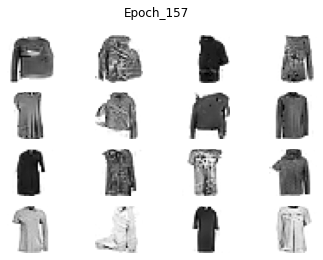



epoch -> [159/200], discriminator_loss_for_real_data = 428.66, discriminator_loss_for_fake_data = 391.20, generator_loss = 1535.72



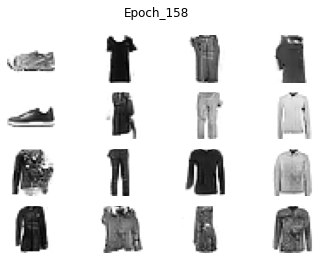



epoch -> [160/200], discriminator_loss_for_real_data = 425.89, discriminator_loss_for_fake_data = 392.67, generator_loss = 1548.79



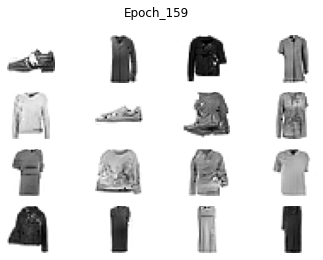



epoch -> [161/200], discriminator_loss_for_real_data = 430.20, discriminator_loss_for_fake_data = 394.21, generator_loss = 1538.23



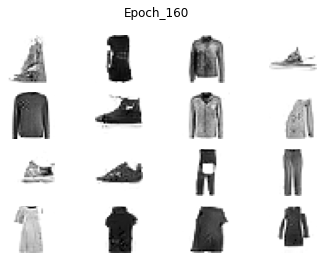



epoch -> [162/200], discriminator_loss_for_real_data = 424.28, discriminator_loss_for_fake_data = 389.66, generator_loss = 1551.38



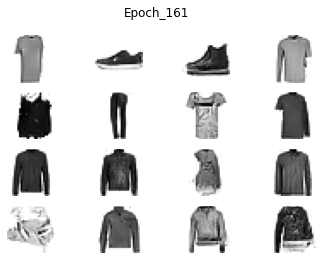



epoch -> [163/200], discriminator_loss_for_real_data = 430.12, discriminator_loss_for_fake_data = 394.27, generator_loss = 1544.00



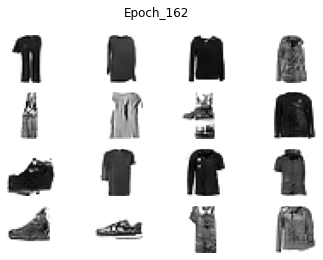



epoch -> [164/200], discriminator_loss_for_real_data = 427.92, discriminator_loss_for_fake_data = 392.46, generator_loss = 1534.18



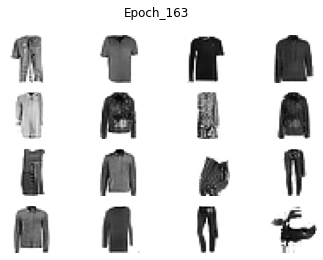



epoch -> [165/200], discriminator_loss_for_real_data = 424.35, discriminator_loss_for_fake_data = 388.76, generator_loss = 1546.87



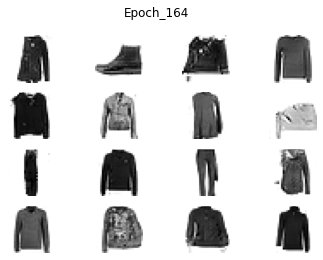



epoch -> [166/200], discriminator_loss_for_real_data = 423.15, discriminator_loss_for_fake_data = 386.07, generator_loss = 1562.76



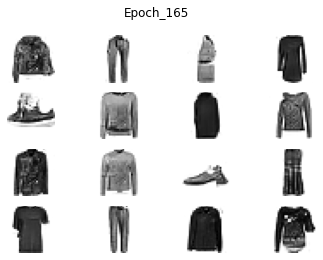



epoch -> [167/200], discriminator_loss_for_real_data = 422.28, discriminator_loss_for_fake_data = 386.58, generator_loss = 1575.31



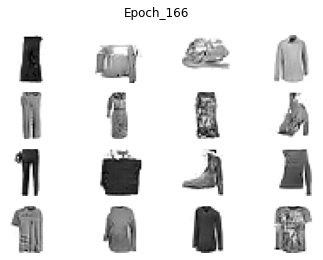



epoch -> [168/200], discriminator_loss_for_real_data = 420.90, discriminator_loss_for_fake_data = 381.83, generator_loss = 1578.99



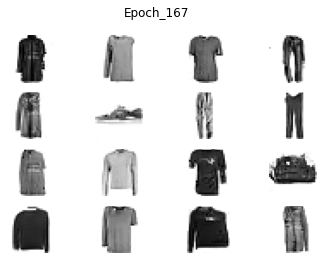



epoch -> [169/200], discriminator_loss_for_real_data = 422.81, discriminator_loss_for_fake_data = 383.95, generator_loss = 1578.80



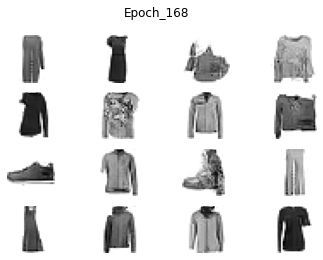



epoch -> [170/200], discriminator_loss_for_real_data = 423.81, discriminator_loss_for_fake_data = 383.89, generator_loss = 1586.62



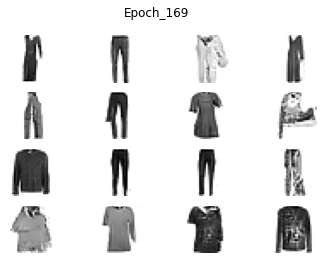



epoch -> [171/200], discriminator_loss_for_real_data = 420.97, discriminator_loss_for_fake_data = 383.95, generator_loss = 1585.87



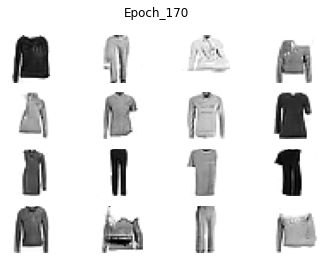



epoch -> [172/200], discriminator_loss_for_real_data = 417.99, discriminator_loss_for_fake_data = 381.75, generator_loss = 1590.87



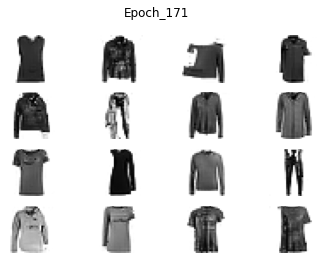



epoch -> [173/200], discriminator_loss_for_real_data = 416.21, discriminator_loss_for_fake_data = 380.42, generator_loss = 1598.90



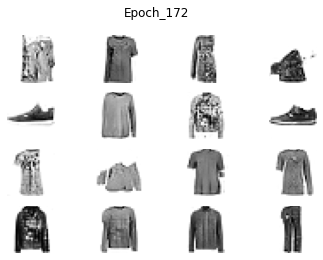



epoch -> [174/200], discriminator_loss_for_real_data = 422.03, discriminator_loss_for_fake_data = 384.88, generator_loss = 1589.99



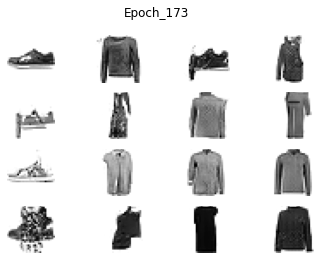



epoch -> [175/200], discriminator_loss_for_real_data = 420.79, discriminator_loss_for_fake_data = 382.50, generator_loss = 1587.26



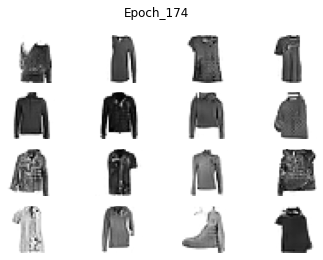



epoch -> [176/200], discriminator_loss_for_real_data = 418.30, discriminator_loss_for_fake_data = 381.65, generator_loss = 1601.96



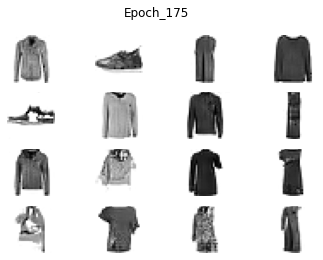



epoch -> [177/200], discriminator_loss_for_real_data = 421.38, discriminator_loss_for_fake_data = 383.48, generator_loss = 1594.04



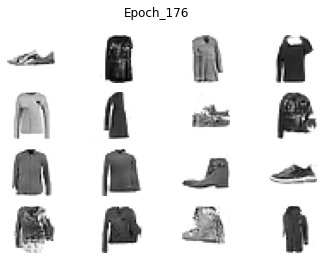



epoch -> [178/200], discriminator_loss_for_real_data = 415.01, discriminator_loss_for_fake_data = 376.34, generator_loss = 1611.56



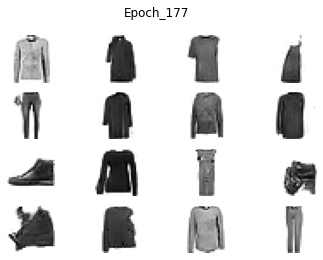



epoch -> [179/200], discriminator_loss_for_real_data = 416.77, discriminator_loss_for_fake_data = 378.54, generator_loss = 1627.13



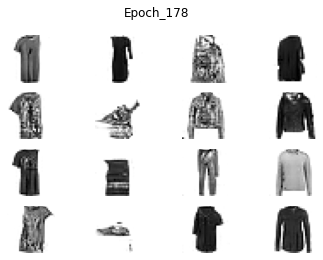



epoch -> [180/200], discriminator_loss_for_real_data = 416.68, discriminator_loss_for_fake_data = 381.16, generator_loss = 1606.79



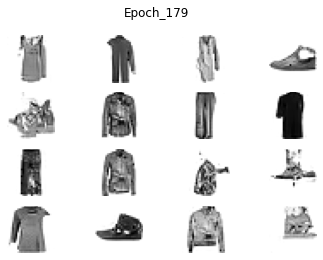



epoch -> [181/200], discriminator_loss_for_real_data = 414.10, discriminator_loss_for_fake_data = 375.87, generator_loss = 1634.59



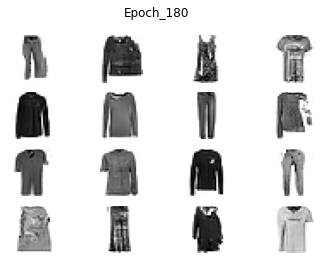



epoch -> [182/200], discriminator_loss_for_real_data = 418.94, discriminator_loss_for_fake_data = 377.59, generator_loss = 1610.44



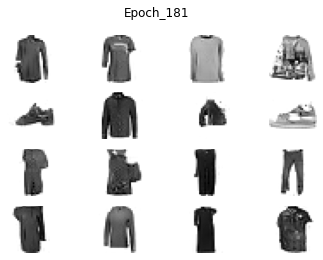



epoch -> [183/200], discriminator_loss_for_real_data = 415.10, discriminator_loss_for_fake_data = 376.39, generator_loss = 1620.20



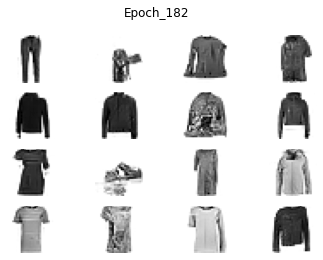



epoch -> [184/200], discriminator_loss_for_real_data = 417.34, discriminator_loss_for_fake_data = 378.05, generator_loss = 1636.50



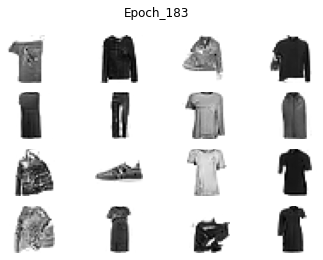



epoch -> [185/200], discriminator_loss_for_real_data = 411.49, discriminator_loss_for_fake_data = 374.75, generator_loss = 1653.51



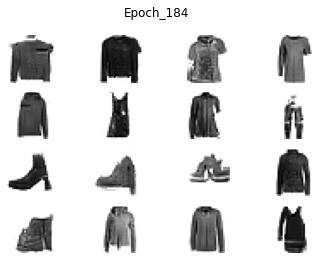



epoch -> [186/200], discriminator_loss_for_real_data = 418.51, discriminator_loss_for_fake_data = 376.85, generator_loss = 1642.62



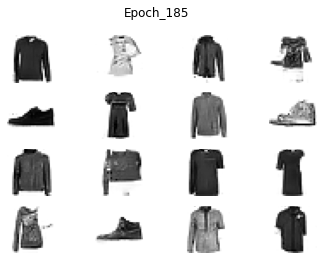



epoch -> [187/200], discriminator_loss_for_real_data = 411.43, discriminator_loss_for_fake_data = 373.98, generator_loss = 1638.77



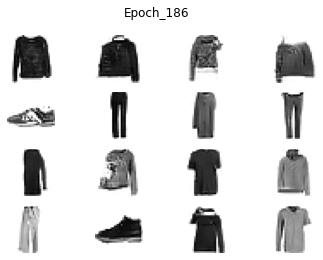



epoch -> [188/200], discriminator_loss_for_real_data = 415.99, discriminator_loss_for_fake_data = 374.55, generator_loss = 1650.80



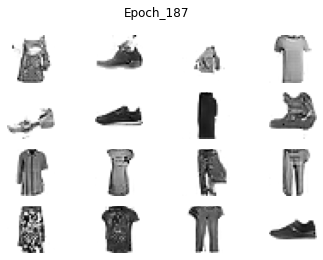



epoch -> [189/200], discriminator_loss_for_real_data = 413.59, discriminator_loss_for_fake_data = 374.77, generator_loss = 1632.55



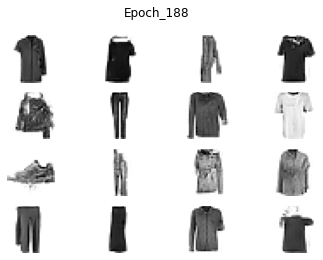



epoch -> [190/200], discriminator_loss_for_real_data = 411.79, discriminator_loss_for_fake_data = 372.15, generator_loss = 1650.54



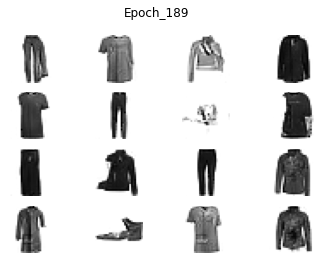



epoch -> [191/200], discriminator_loss_for_real_data = 410.76, discriminator_loss_for_fake_data = 371.97, generator_loss = 1655.49



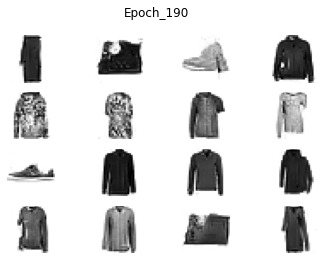



epoch -> [192/200], discriminator_loss_for_real_data = 407.91, discriminator_loss_for_fake_data = 370.90, generator_loss = 1666.90



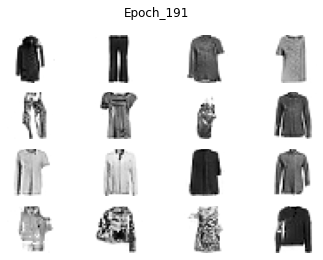



epoch -> [193/200], discriminator_loss_for_real_data = 408.96, discriminator_loss_for_fake_data = 370.27, generator_loss = 1670.09



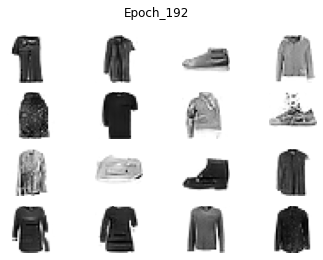



epoch -> [194/200], discriminator_loss_for_real_data = 404.93, discriminator_loss_for_fake_data = 368.72, generator_loss = 1676.89



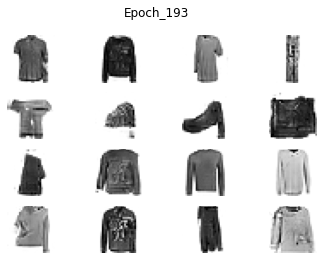



epoch -> [195/200], discriminator_loss_for_real_data = 411.38, discriminator_loss_for_fake_data = 371.82, generator_loss = 1682.33



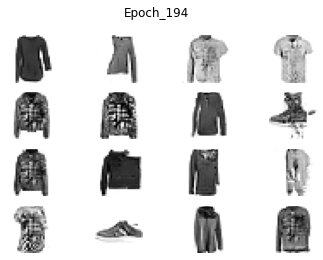



epoch -> [196/200], discriminator_loss_for_real_data = 410.60, discriminator_loss_for_fake_data = 369.00, generator_loss = 1671.89



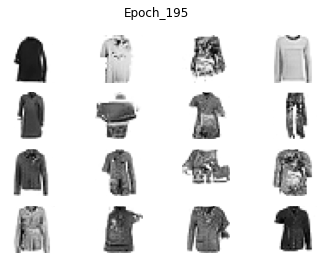



epoch -> [197/200], discriminator_loss_for_real_data = 404.53, discriminator_loss_for_fake_data = 365.80, generator_loss = 1697.96



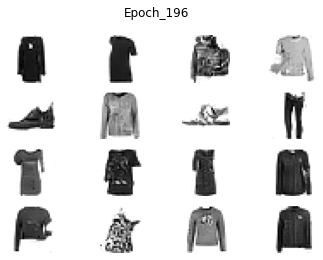



epoch -> [198/200], discriminator_loss_for_real_data = 403.45, discriminator_loss_for_fake_data = 367.30, generator_loss = 1682.54



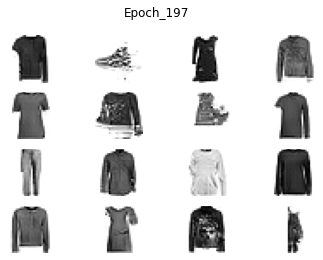



epoch -> [199/200], discriminator_loss_for_real_data = 405.50, discriminator_loss_for_fake_data = 362.42, generator_loss = 1691.31



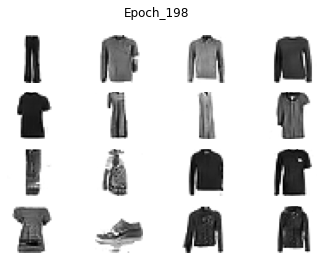



epoch -> [200/200], discriminator_loss_for_real_data = 402.79, discriminator_loss_for_fake_data = 365.65, generator_loss = 1695.62



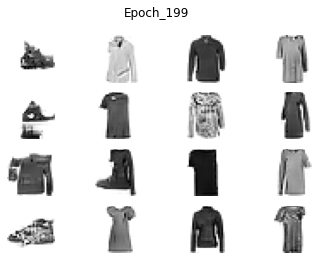

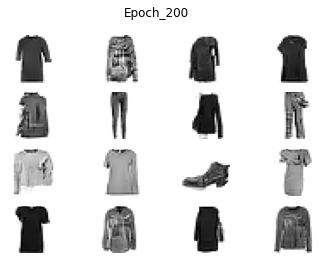

In [ ]:
with tf.device(device_name):

  latent_dim = 100
  n_epochs = 200
  d_model = define_discriminator()
  g_model = define_generator(latent_dim)
  gan_model = define_gan(g_model, d_model)
  dataset = load_real_samples()
  print('\nREADY TO GO !!!\n')
  
  d_loss_r, d_loss_f, g_loss = train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs)

## Plot Loss Values

In [ ]:
loaded = np.load('/content/drive/MyDrive/GAN_New_Approch/2/loss_record.npz')
print(loaded['a'].shape)
print(loaded['b'].shape)
print(loaded['c'].shape)

(200,)
(200,)
(200,)


In [ ]:
import matplotlib.pyplot as plot

g_loss = np.array(loaded['c'])

In [ ]:
d_loss = np.array([(i+j) for i,j in zip(loaded['a'], loaded['b'])])

In [ ]:
# print(d_loss_r)
# print(d_loss_f)
# print(d_loss)
# print(g_loss)

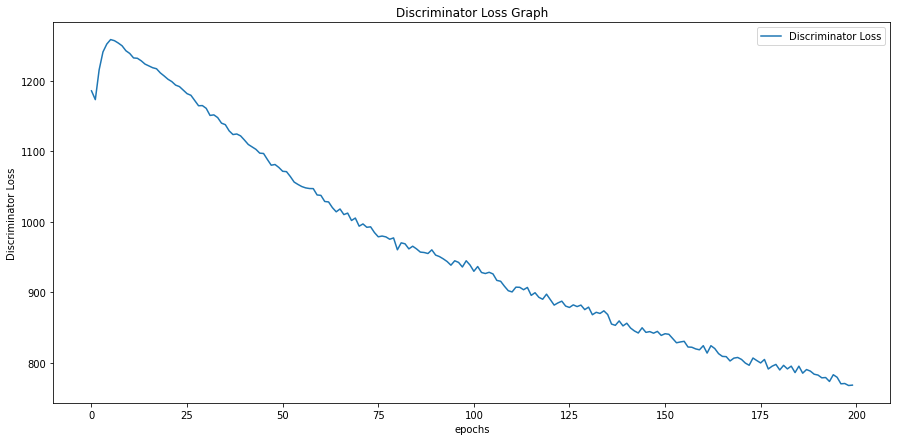

In [ ]:
plt.figure(figsize=(15,7))
plt.plot(d_loss)
plt.title('Discriminator Loss Graph')
plt.ylabel('Discriminator Loss')
plt.xlabel('epochs')
plt.legend(["Discriminator Loss"], loc='upper right')
plt.show()

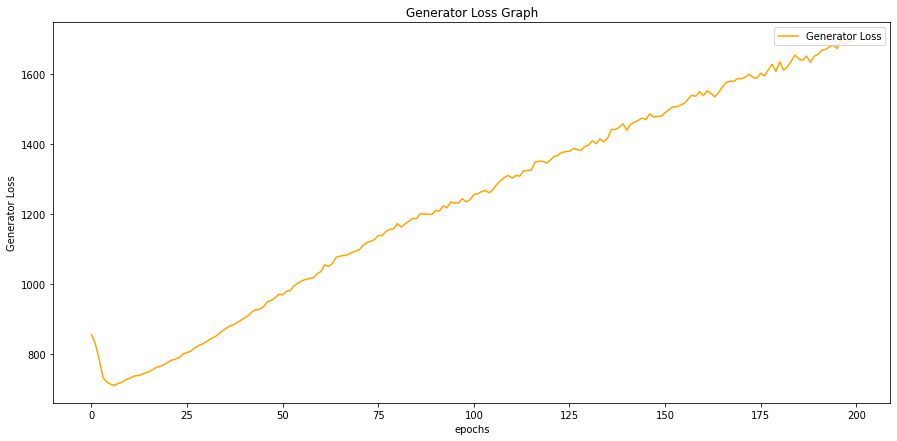

In [ ]:
plt.figure(figsize=(15,7))
plt.plot(g_loss,color='orange')
plt.title('Generator Loss Graph')
plt.ylabel('Generator Loss')
plt.xlabel('epochs')
plt.legend(["Generator Loss"], loc='upper right')
plt.show()

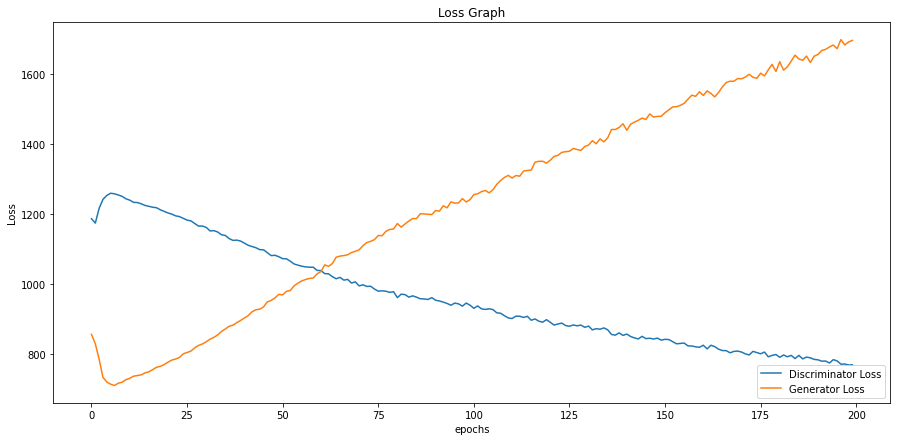

In [ ]:
plt.figure(figsize=(15,7))
plt.plot(d_loss)
plt.plot(g_loss)
plt.title('Loss Graph')
plt.ylabel('Loss')
plt.xlabel('epochs')
plt.legend(["Discriminator Loss", "Generator Loss"], loc='lower right')
plt.show()

# Prediction

latent points(latent points and labels):  (16, 100) (16,)

Generated images with labels:  (16, 28, 28, 1) 



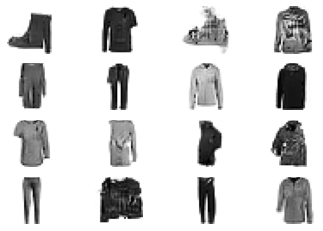

In [ ]:
latent_dim = 100
n_samples = 16
z_input, labels = generate_latent_points(latent_dim, n_samples)
print("latent points(latent points and labels): ",z_input.shape, labels.shape)
data = [z_input,labels]
pred = g_model.predict(data)
pred = (pred +1 ) / 2.0
print("\nGenerated images with labels: ",pred.shape,'\n')
save_plot(pred,labels,n=4)

                                              -:END:-

In [ ]:
# import numpy as np
# test_array = np.random.rand(3, 2)
# test_vector = np.random.rand(4)
# test_vector_1 = np.random.rand(4,1,4,2)
# np.savez_compressed('ok.npz', a=test_array, b=test_vector, c=test_vector_1)
# loaded = np.load('ok.npz')
# print(loaded['a'].shape)
# print(loaded['b'].shape)
# print(loaded['c'].shape)